In [ ]:
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pyabf


In [2]:
# Load it back from the file
with open("binned_waveforms.pkl", "rb") as f:
    binned_waveforms_old = pickle.load(f)

print("Loaded:", list(binned_waveforms_old.keys())[:5]) 

Loaded: [(np.float64(25.233409033558843), 'Excitatory', 'CaP', 'primary'), (np.float64(32.61578604044627), 'Excitatory', 'CaP', 'primary'), (np.float64(36.50967506389131), 'Excitatory', 'CaP', 'primary'), (np.float64(26.212319790300285), 'Excitatory', 'CaP', 'primary'), (np.float64(22.836263987212853), 'Excitatory', 'CaP', 'primary')]


In [62]:
with open("binned_waveforms_moreabfs.pkl", "rb") as f:
    binned_waveforms1 = pickle.load(f)

print("Loaded:", list(binned_waveforms1.keys())[:5])  # peek at a few keys


Loaded: [(np.float64(70.57163020465765), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(37.13330857779412), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(29.629629629631626), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(25.393600812594386), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(26.773761713520752), 'Inhibitory (Rs compensation)', 'CaP', 'primary')]


In [69]:
with open("binned_waveforms_moreabfs2.pkl", "wb") as f:
    pickle.dump(binned_waveforms2, f)

In [94]:
with open("binned_waveforms_all.pkl", "wb") as f:
    pickle.dump(binned_waveforms_new, f)

In [61]:
print(len(binned_waveforms1.keys()))
print(len(binned_waveforms_old.keys()))

11557
14890


In [63]:
binned_waveforms_new = {}
binned_waveforms_new = binned_waveforms2 | binned_waveforms_old
print(len(binned_waveforms_new.keys()))

26447


In [6]:
for key, df in binned_waveforms_new.items():
    if df.shape != (50, 4):

        print(f"Key {key}: shape is incorrect {df.shape}")


Key (np.float64(7142.857142402511), 'Excitatory (Rs compensation)', 'vSMN', 'High Rin Secondary'): shape is incorrect (15, 4)


In [21]:
from collections import Counter

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif 45 <= freq < 75:
        return "45+"
        
def group_iSMN(cell_type):
    if cell_type in ["iSMN (dorsal) muscle", "iSMN"]:
        return "iSMN"
    elif cell_type in ['vSMN ','vSMN']:
        return 'vSMN'
    return cell_type

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

key_counts_all = Counter()

for freq, signal_type, cell_type, fast_slow in binned_waveforms_new.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    signal_type_gen = group_EI(signal_type)
    grouped_key = (freq_bin, signal_type_gen, cell_type_gen)
    key_counts_all[grouped_key] += 1

In [8]:
key_counts_all

Counter({('25–35', 'Inhibitory', 'vSMN'): 1510,
         ('25–35', 'Excitatory', 'MiP'): 1286,
         ('25–35', 'Excitatory', 'vSMN'): 1246,
         ('25–35', 'Excitatory', 'iSMN'): 1130,
         ('25–35', 'Excitatory', 'vRoP'): 1038,
         ('15–25', 'Cell-attached', 'MiP'): 986,
         ('25–35', 'Inhibitory', 'iSMN'): 926,
         ('25–35', 'Cell-attached', 'MiP'): 878,
         ('25–35', 'Inhibitory', 'dSMN'): 871,
         ('15–25', 'Cell-attached', 'CaP'): 794,
         ('15–25', 'Excitatory', 'CaP'): 727,
         ('25–35', 'Excitatory', 'CaP'): 675,
         ('15–25', 'Excitatory', 'MiP'): 647,
         ('25–35', 'Cell-attached', 'vRoP'): 599,
         ('25–35', 'Excitatory', 'dRoP'): 531,
         ('25–35', 'Cell-attached', 'vSMN'): 501,
         ('25–35', 'Inhibitory', 'vRoP'): 417,
         ('15–25', 'Cell-attached', 'vSMN'): 377,
         ('25–35', 'Excitatory', 'dSMN'): 367,
         ('15–25', 'Cell-attached', 'iSMN'): 352,
         ('15–25', 'Inhibitory', 'CaP'): 

In [33]:
from collections import Counter

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif 45 <= freq < 75:
        return "45+"
        
def group_iSMN(cell_type):
    if cell_type in ["iSMN (dorsal) muscle", "iSMN"]:
        return "iSMN"
    elif cell_type in ['vSMN ','vSMN']:
        return 'vSMN'
    return cell_type

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

key_counts_all1 = Counter()

for freq, signal_type, cell_type, fast_slow in binned_waveforms2.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    signal_type_gen = group_EI(signal_type)
    grouped_key = (freq_bin, signal_type_gen, cell_type_gen)
    key_counts_all1[grouped_key] += 1

In [34]:
key_counts_all1

Counter({('25–35', 'Inhibitory', 'vSMN'): 1084,
         ('25–35', 'Excitatory', 'vSMN'): 950,
         ('25–35', 'Excitatory', 'iSMN'): 924,
         ('25–35', 'Excitatory', 'MiP'): 910,
         ('25–35', 'Inhibitory', 'iSMN'): 770,
         ('15–25', 'Excitatory', 'MiP'): 607,
         ('25–35', 'Excitatory', 'CaP'): 545,
         ('15–25', 'Excitatory', 'CaP'): 508,
         ('25–35', 'Excitatory', 'dRoP'): 394,
         ('15–25', 'Inhibitory', 'CaP'): 348,
         ('25–35', 'Inhibitory', 'dSMN'): 278,
         (None, 'Excitatory', 'iSMN'): 220,
         (None, 'Inhibitory', 'vSMN'): 202,
         ('25–35', 'Inhibitory', 'CaP'): 197,
         ('25–35', 'Inhibitory', 'dVS'): 185,
         (None, 'Inhibitory', 'iSMN'): 173,
         (None, 'Excitatory', 'CaP'): 170,
         ('25–35', 'Excitatory', 'dVS'): 167,
         (None, 'Excitatory', 'vSMN'): 163,
         ('35–45', 'Excitatory', 'dRoP'): 161,
         ('35–45', 'Excitatory', 'iSMN'): 160,
         ('35–45', 'Inhibitory', 'vS

In [31]:
import numpy as np

def replace_phase_values(binned_waveforms):
    """
    Replace the 'Phase' column in each DataFrame in binned_waveforms 
    with evenly spaced values from 0.01 to 1.00 in steps of 0.02.
    """
    new_phase = np.arange(0.01, 1.00001, 0.02)
    
    for key, df in binned_waveforms.items():
        if len(df) != len(new_phase):
            print(f"Skipping key {key}: length mismatch (df has {len(df)} rows, expected {len(new_phase)})")
            continue
        df['Phase'] = new_phase

    return binned_waveforms
binned_waveforms2 = replace_phase_values(binned_waveforms1)


Skipping key (np.float64(7142.857142402511), 'Excitatory (Rs compensation)', 'vSMN', 'High Rin Secondary'): length mismatch (df has 15 rows, expected 50)


In [37]:
average_waveforms_for_key(('25–35', 'Inhibitory', 'vSMN'), binned_waveforms2)

No matching waveforms found for ('25–35', 'Inhibitory', 'vSMN')


In [9]:
list(key_counts_all.keys())[:5]

[('45+', 'Inhibitory', 'CaP'),
 ('35–45', 'Inhibitory', 'CaP'),
 ('25–35', 'Inhibitory', 'CaP'),
 (None, 'Inhibitory', 'CaP'),
 ('15–25', 'Inhibitory', 'CaP')]

In [ ]:
phase = np.arange(0.01, 1.00001, 0.02)
phase

array([0.01, 0.03, 0.05, ..., 0.95, 0.97, 0.99], shape=(50,))

In [11]:
keys_to_delete = [key for key, df in binned_waveforms_new.items() if df.shape != (50, 4)]

for key in keys_to_delete:
    print(f"Deleting key due to unexpected shape {binned_waveforms_new[key].shape}: {key}")
    del binned_waveforms_new[key]


Deleting key due to unexpected shape (15, 4): (np.float64(7142.857142402511), 'Excitatory (Rs compensation)', 'vSMN', 'High Rin Secondary')


In [54]:
def average_waveforms_for_key(counter_key, binned):
    """
    Takes a counter key like ('20–30', 'Excitatory', 'MiP')
    Returns a DataFrame with mean and SEM of normalized current for that key
    """
    import numpy as np
    import pandas as pd

    phase = np.arange(0.01, 1.00001, 0.02)
    freq_bin, signal_type, cell_type = counter_key

    dfs = []
    for key in binned:
        freq, st, ct, fs = key
        freq_bin_key = get_freq_bin(freq)
        if freq_bin_key is None:
            continue

        if freq_bin_key == freq_bin and \
           group_iSMN(ct) == group_iSMN(cell_type) and \
           group_EI(st) == group_EI(signal_type):
            
            df = binned[key].copy()
            if len(df) != len(phase):
                print(f"Skipping key {key}: length mismatch (len(df) = {len(df)})")
                continue
            df['Phase'] = phase
            dfs.append(df)

    if not dfs:
        print(f"No matching waveforms found for {counter_key}")
        return None

    combined = pd.concat(dfs)
    grouped = combined.groupby('Phase', observed=False)['Normalized Current']
    averaged = grouped.mean().reset_index(name='Normalized Current')
    sem = grouped.sem().reset_index(name='SEM')
    sem['SEM'] = sem['SEM'].astype(float)

    result = pd.merge(averaged, sem, on='Phase')
    return result


In [55]:
one_counter_key = list(key_counts_all1.keys())[7]
ex_avg_df = average_waveforms_for_key(one_counter_key,binned_waveforms2)
ex_avg_df

,Phase,Normalized Current,SEM
0,0.01,0.630399,0.007444
1,0.03,0.623256,0.007235
2,0.05,0.611039,0.007415
3,0.07,0.599673,0.007381
4,0.09,0.593298,0.007150
5,0.11,0.579110,0.007222
6,0.13,0.574603,0.006962
7,0.15,0.564867,0.007292
8,0.17,0.567579,0.007263
9,0.19,0.573422,0.007199


In [56]:
one_counter_key = list(key_counts_all.keys())[7]
ex_avg_df = average_waveforms_for_key(one_counter_key,binned_waveforms_old)
ex_avg_df

,Phase,Normalized Current,SEM
0,0.01,0.641312,0.011951
1,0.03,0.621092,0.011204
2,0.05,0.612888,0.010923
3,0.07,0.606836,0.011089
4,0.09,0.577112,0.010916
5,0.11,0.570653,0.011077
6,0.13,0.565402,0.010599
7,0.15,0.554124,0.011177
8,0.17,0.545010,0.011166
9,0.19,0.540021,0.010889


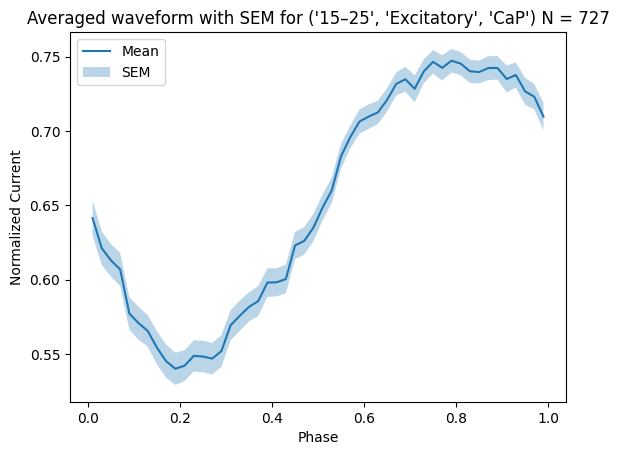

In [15]:
def plot_avg_wf(avg_waveform_df,key):
    count = key_counts_all[key]  # Get count for current key

    if avg_waveform_df is not None:
        plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label='Mean')
        plt.fill_between(avg_waveform_df['Phase'],
                        avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                        avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                        alpha=0.3, label='SEM')
        plt.xlabel('Phase')
        plt.ylabel('Normalized Current')
        plt.title(f'Averaged waveform with SEM for {key} N = {count}')
        plt.legend()
        plt.show()

plot_avg_wf(ex_avg_df,one_counter_key)

In [80]:
# Initialize sets for each key component
freq_bins = set()
signal_types = set()
cell_types = set()

# Loop through all keys in key_counts_all
for freq_bin, signal_type, cell_type in key_counts_all.keys():
    freq_bins.add(freq_bin)
    signal_types.add(signal_type)
    cell_types.add(cell_type)

# Convert sets to sorted lists (optional)
freq_bins.remove(None)

freq_bins = sorted(freq_bins)
signal_types = sorted(signal_types)
cell_types = sorted(cell_types)

# Print or return
print("Frequency Bins:", freq_bins)
print("Signal Types:", signal_types)
print("Cell Types:", cell_types)
# freq_bins.remove('<15')
# signal_types.remove('Cell-attached')



Frequency Bins: ['15–25', '25–35', '35–45', '45+']
Signal Types: ['Cell-attached', 'Excitatory', 'Inhibitory']
Cell Types: ['CaP', 'MiP', 'dRoP', 'dSMN', 'dVS', 'iSMN', 'vRoP', 'vSMN']


In [ ]:
for freq, signal_type, cell_type, fast_slow in binned_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    signal_type_gen = group_EI(signal_type)
    grouped_key = (freq_bin, signal_type_gen, cell_type_gen, fast_slow)

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_48648/1905956510.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(cell_types))


No matching waveforms found for ('15–25', 'Inhibitory', 'dRoP')
No matching waveforms found for ('25–35', 'Inhibitory', 'dRoP')
No matching waveforms found for ('35–45', 'Inhibitory', 'dRoP')
No matching waveforms found for ('45+', 'Inhibitory', 'dRoP')


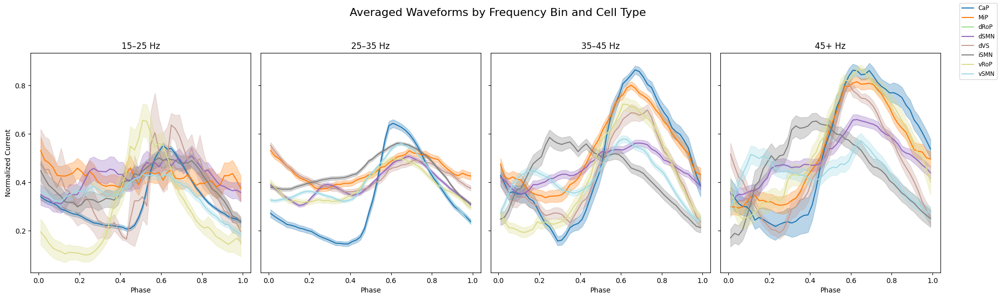

In [67]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

# Ensure these variables are defined beforehand:
# cell_types, freq_bins, binned_waveforms_new, average_waveforms_for_key

signal_types = ["Inhibitory"]

# Assign unique colors to each cell type
cmap = cm.get_cmap('tab20', len(cell_types))
cell_type_colors = {ctype: cmap(i) for i, ctype in enumerate(cell_types)}

# Create subplots: 1 row for now since only one signal type
fig, axes = plt.subplots(1, len(freq_bins), figsize=(20, 6), sharex=True, sharey=True)

# If only one axis (e.g., 1 bin), wrap in list for compatibility
if len(freq_bins) == 1:
    axes = [axes]

for j, freq_bin in enumerate(freq_bins):
    ax = axes[j]
    for cell_type in cell_types:
        counter_key = (freq_bin, signal_types[0], cell_type)
        avg_waveform_df = average_waveforms_for_key(counter_key, binned_waveforms_new)
        if avg_waveform_df is None or avg_waveform_df.empty:
            continue

        label = f"{cell_type} ({signal_types[0]})"
        ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                label=label, color=cell_type_colors[cell_type])
        ax.fill_between(avg_waveform_df['Phase'],
                        avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                        avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                        color=cell_type_colors[cell_type], alpha=0.3)

    ax.set_title(f"{freq_bin} Hz")
    ax.set_xlabel("Phase")
    if j == 0:
        ax.set_ylabel("Normalized Current")

# Finalize layout and add legend
handles = [plt.Line2D([0], [0], color=cell_type_colors[ctype], label=ctype) for ctype in cell_types]
fig.legend(handles, [h.get_label() for h in handles], loc='upper right', fontsize='small')

fig.suptitle("Averaged Waveforms by Frequency Bin and Cell Type", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

/var/folders/mw/pz4gm95j6zb7syl48vm11wrw0000gn/T/ipykernel_12071/1880139839.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(cell_types))


No matching waveforms found for ('15–25', 'Excitatory', 'iSMN')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN')
No matching waveforms found for ('35–45', 'Excitatory', 'iSMN')
No matching waveforms found for ('45+', 'Excitatory', 'iSMN')


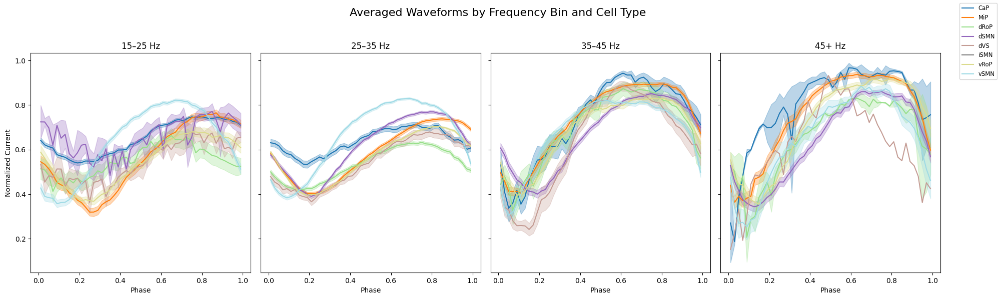

In [66]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

# Ensure these variables are defined beforehand:
# cell_types, freq_bins, binned_waveforms_new, average_waveforms_for_key

signal_types = ["Excitatory"]

# Assign unique colors to each cell type
cmap = cm.get_cmap('tab20', len(cell_types))
cell_type_colors = {ctype: cmap(i) for i, ctype in enumerate(cell_types)}

# Create subplots: 1 row for now since only one signal type
fig, axes = plt.subplots(1, len(freq_bins), figsize=(20, 6), sharex=True, sharey=True)

# If only one axis (e.g., 1 bin), wrap in list for compatibility
if len(freq_bins) == 1:
    axes = [axes]

for j, freq_bin in enumerate(freq_bins):
    ax = axes[j]
    for cell_type in cell_types:
        counter_key = (freq_bin, signal_types[0], cell_type)
        avg_waveform_df = average_waveforms_for_key(counter_key, binned_waveforms_new)
        if avg_waveform_df is None or avg_waveform_df.empty:
            continue

        label = f"{cell_type} ({signal_types[0]})"
        ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                label=label, color=cell_type_colors[cell_type])
        ax.fill_between(avg_waveform_df['Phase'],
                        avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                        avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                        color=cell_type_colors[cell_type], alpha=0.3)

    ax.set_title(f"{freq_bin} Hz")
    ax.set_xlabel("Phase")
    if j == 0:
        ax.set_ylabel("Normalized Current")

# Finalize layout and add legend
handles = [plt.Line2D([0], [0], color=cell_type_colors[ctype], label=ctype) for ctype in cell_types]
fig.legend(handles, [h.get_label() for h in handles], loc='upper right', fontsize='small')

fig.suptitle("Averaged Waveforms by Frequency Bin and Cell Type", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_48648/1400482574.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis', len(freq_bins))


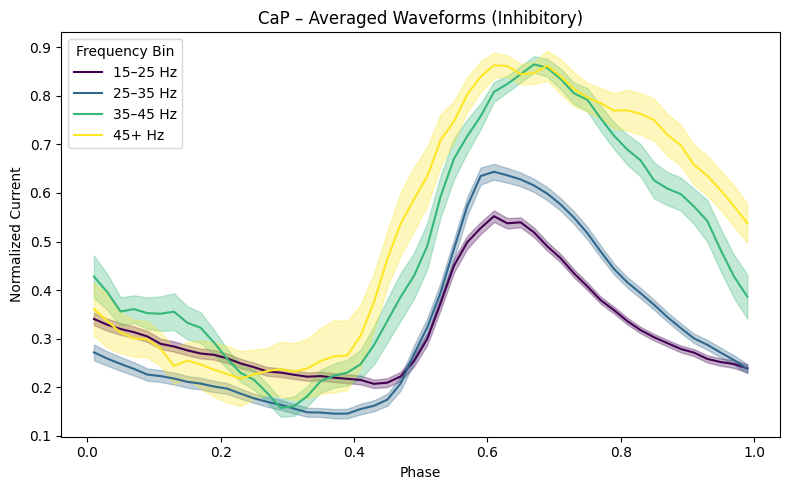

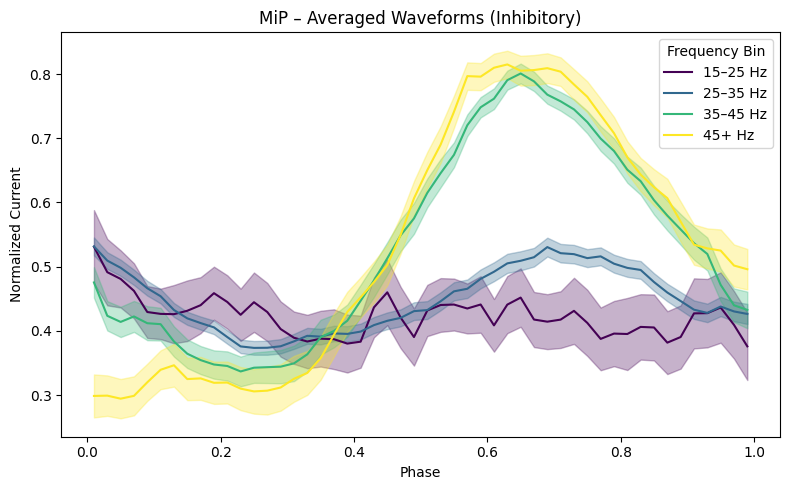

No matching waveforms found for ('15–25', 'Inhibitory', 'dRoP')
No matching waveforms found for ('25–35', 'Inhibitory', 'dRoP')
No matching waveforms found for ('35–45', 'Inhibitory', 'dRoP')
No matching waveforms found for ('45+', 'Inhibitory', 'dRoP')


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_48648/1400482574.py:34: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Frequency Bin")


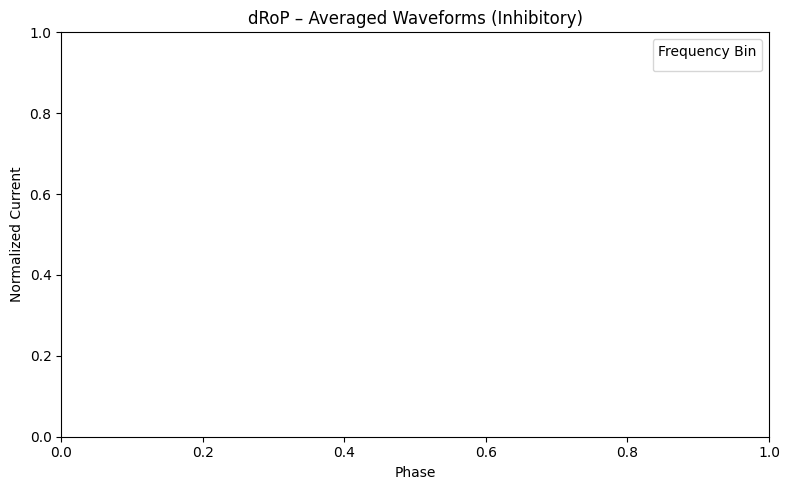

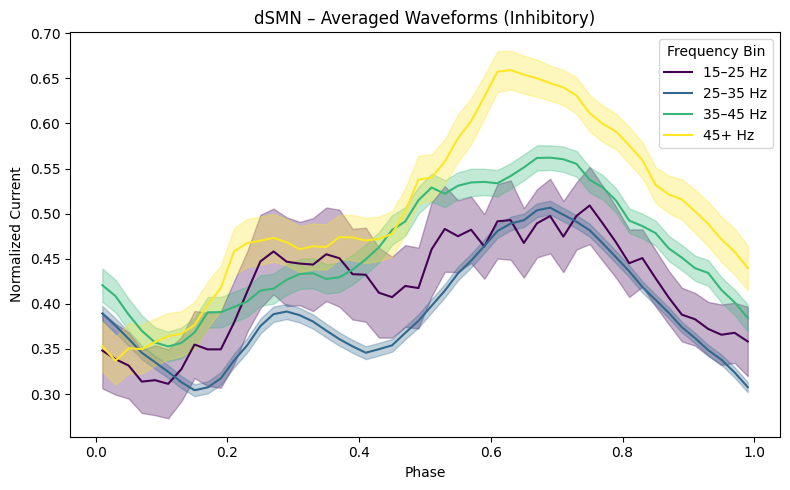

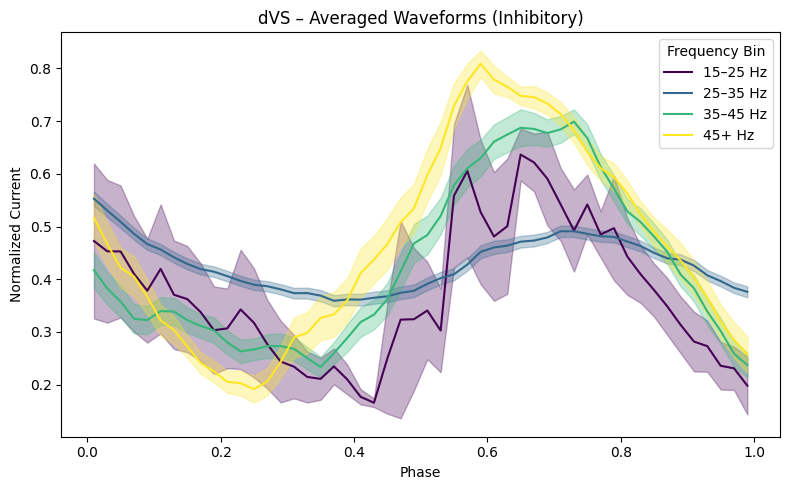

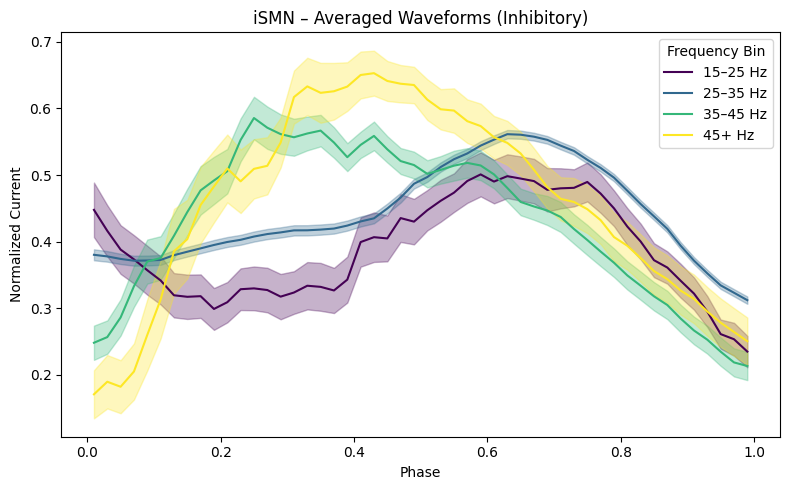

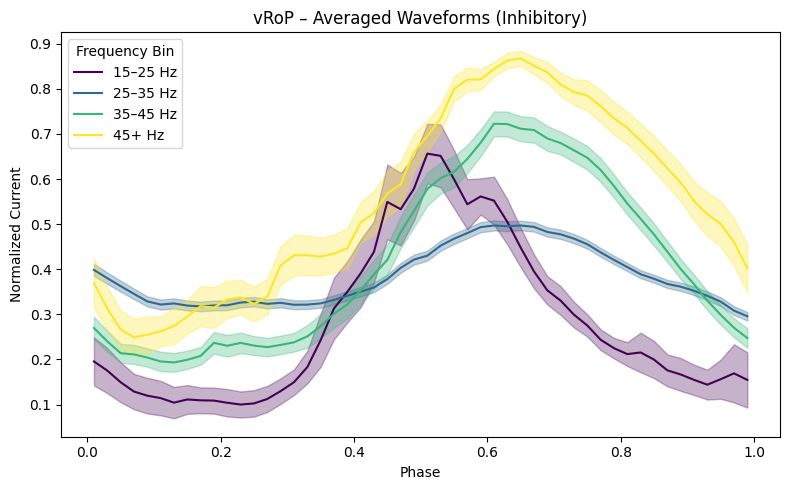

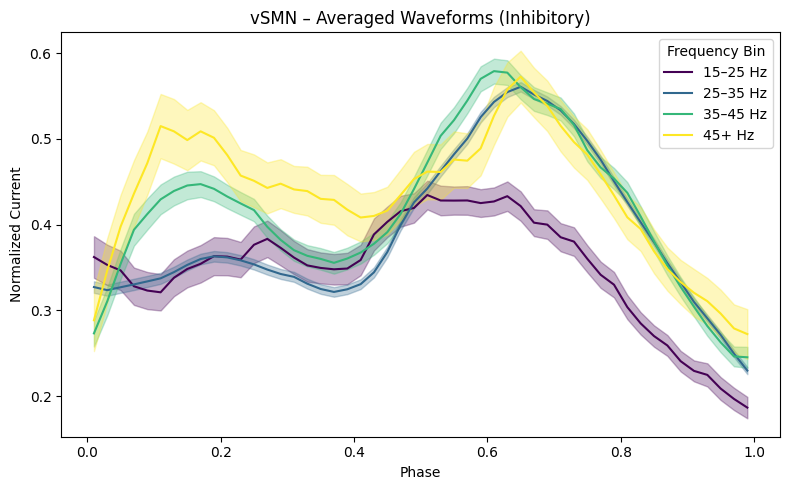

In [66]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

# Define variables: ensure these are already available in your environment
# cell_types, freq_bins, binned_waveforms_new, average_waveforms_for_key

signal_type = "Inhibitory"

# Assign unique colors to each frequency bin
cmap = cm.get_cmap('viridis', len(freq_bins))
freq_bin_colors = {freq: cmap(i) for i, freq in enumerate(freq_bins)}

for cell_type in cell_types:
    plt.figure(figsize=(8, 5))
    
    for freq_bin in freq_bins:
        counter_key = (freq_bin, signal_type, cell_type)
        avg_waveform_df = average_waveforms_for_key(counter_key, binned_waveforms_new)
        if avg_waveform_df is None or avg_waveform_df.empty:
            continue

        label = f"{freq_bin} Hz"
        plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                 label=label, color=freq_bin_colors[freq_bin])
        plt.fill_between(avg_waveform_df['Phase'],
                         avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                         avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                         color=freq_bin_colors[freq_bin], alpha=0.3)

    plt.title(f"{cell_type} – Averaged Waveforms ({signal_type})")
    plt.xlabel("Phase")
    plt.ylabel("Normalized Current")
    plt.legend(title="Frequency Bin")
    plt.tight_layout()
    plt.show()


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_48648/2117061571.py:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(cell_types))


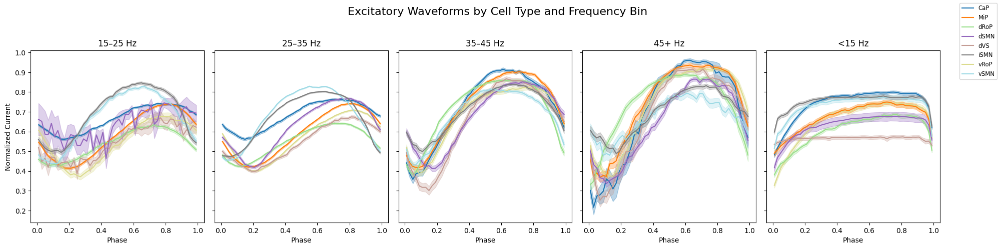

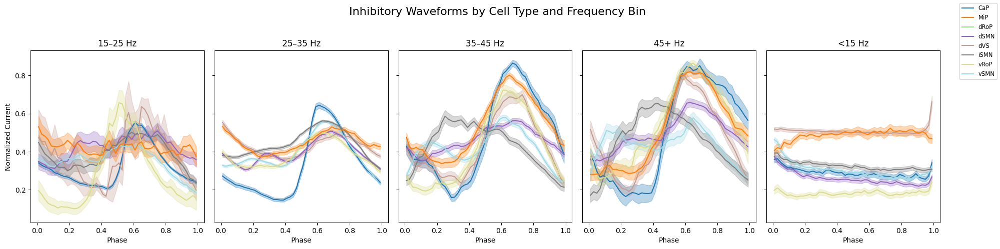

In [70]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
import numpy as np
from collections import defaultdict

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif 45 <= freq < 65:
        return "45+"
    else:
        return "<15"

def group_iSMN(cell_type):
    cell_type = cell_type.strip()
    if cell_type in ["iSMN (dorsal) muscle", "iSMN"]:
        return "iSMN"
    if cell_type == "vSMN":
        return "vSMN"
    return cell_type

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

def average_waveforms_for_keylist(waveforms):
    """Returns DataFrame with Phase, Mean, and SEM from list of waveforms."""
    phase = np.arange(0.01, 1.00001, 0.02)
    combined = pd.concat(waveforms)
    combined['Phase'] = np.tile(phase, len(waveforms))
    grouped = combined.groupby('Phase')['Normalized Current']
    mean = grouped.mean().reset_index(name='Mean')
    sem = grouped.sem().reset_index(name='SEM')
    return pd.merge(mean, sem, on='Phase')

def plot_all_waveforms_by_signal_type(binned_waveforms):
    # Organize waveforms into dict: [freq_bin][signal_type][cell_type] = [list of dfs]
    grouped = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))

    for key, df in binned_waveforms.items():
        if df.shape != (50, 4):
            continue
        freq, signal_type, cell_type, fast_slow = key
        freq_bin = get_freq_bin(freq)
        signal_type = group_EI(signal_type)
        cell_type = group_iSMN(cell_type)
        grouped[freq_bin][signal_type][cell_type].append(df.copy())

    cell_types = sorted({group_iSMN(k[2]) for k in binned_waveforms})
    cmap = cm.get_cmap('tab20', len(cell_types))
    cell_type_colors = {ctype: cmap(i) for i, ctype in enumerate(cell_types)}

    for signal_type in ["Excitatory", "Inhibitory"]:
        fig, axes = plt.subplots(1, len(grouped), figsize=(20, 5), sharey=True)
        if len(grouped) == 1:
            axes = [axes]
        for j, freq_bin in enumerate(sorted(grouped)):
            ax = axes[j]
            for cell_type in grouped[freq_bin][signal_type]:
                waveforms = grouped[freq_bin][signal_type][cell_type]
                if not waveforms:
                    continue
                avg_df = average_waveforms_for_keylist(waveforms)
                ax.plot(avg_df['Phase'], avg_df['Mean'], label=cell_type, color=cell_type_colors[cell_type])
                ax.fill_between(avg_df['Phase'], avg_df['Mean'] - avg_df['SEM'], avg_df['Mean'] + avg_df['SEM'],
                                color=cell_type_colors[cell_type], alpha=0.3)

            ax.set_title(f"{freq_bin} Hz")
            ax.set_xlabel("Phase")
            if j == 0:
                ax.set_ylabel("Normalized Current")
        fig.suptitle(f"{signal_type} Waveforms by Cell Type and Frequency Bin", fontsize=16)
        fig.legend(handles=[plt.Line2D([0], [0], color=cell_type_colors[ct], label=ct) for ct in cell_types],
                   loc='upper right', fontsize='small')
        plt.tight_layout(rect=[0, 0, 0.95, 0.95])
        plt.show()
plot_all_waveforms_by_signal_type(binned_waveforms_new)


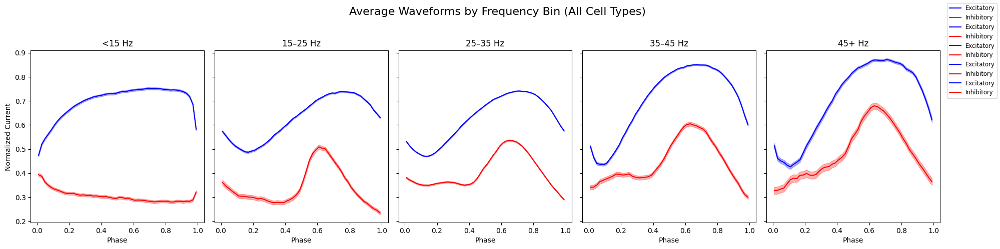

In [71]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif 45 <= freq < 65:
        return "45+"
    else:
        return "<15"

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

def average_waveforms_for_keylist(waveforms):
    """Returns DataFrame with Phase, Mean, and SEM from list of waveforms."""
    phase = np.arange(0.01, 1.00001, 0.02)
    combined = pd.concat(waveforms)
    combined['Phase'] = np.tile(phase, len(waveforms))
    grouped = combined.groupby('Phase')['Normalized Current']
    mean = grouped.mean().reset_index(name='Mean')
    sem = grouped.sem().reset_index(name='SEM')
    return pd.merge(mean, sem, on='Phase')

def plot_avg_waveforms_by_signal_type2(binned_waveforms):
    # Organize waveforms into dict: [freq_bin][signal_type] = list of dfs
    grouped = defaultdict(lambda: defaultdict(list))

    for key, df in binned_waveforms.items():
        if df.shape != (50, 4):
            continue
        freq, signal_type, _, _ = key
        freq_bin = get_freq_bin(freq)
        signal_type = group_EI(signal_type)
        grouped[freq_bin][signal_type].append(df.copy())

    freq_bins_sorted = sorted(grouped.keys(), key=lambda x: ["<15", "15–25", "25–35", "35–45", "45+"].index(x))
    signal_colors = {"Excitatory": "blue", "Inhibitory": "red"}

    fig, axes = plt.subplots(1, len(freq_bins_sorted), figsize=(20, 5), sharey=True)
    if len(freq_bins_sorted) == 1:
        axes = [axes]

    for j, freq_bin in enumerate(freq_bins_sorted):
        ax = axes[j]
        for signal_type in ["Excitatory", "Inhibitory"]:
            waveforms = grouped[freq_bin].get(signal_type, [])
            if not waveforms:
                continue
            avg_df = average_waveforms_for_keylist(waveforms)
            color = signal_colors[signal_type]
            ax.plot(avg_df['Phase'], avg_df['Mean'], label=signal_type, color=color)
            ax.fill_between(avg_df['Phase'], avg_df['Mean'] - avg_df['SEM'], avg_df['Mean'] + avg_df['SEM'],
                            color=color, alpha=0.3)

        ax.set_title(f"{freq_bin} Hz")
        ax.set_xlabel("Phase")
        if j == 0:
            ax.set_ylabel("Normalized Current")

    fig.suptitle("Average Waveforms by Frequency Bin (All Cell Types)", fontsize=16)
    fig.legend(loc='upper right', fontsize='small')
    plt.tight_layout(rect=[0, 0, 0.95, 0.95])
    plt.show()
plot_avg_waveforms_by_signal_type2(binned_waveforms_new)


In [72]:
import pandas as pd
import numpy as np
from collections import defaultdict

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

def compute_variance_by_swim_speed(binned_waveforms):
    # Organize: [fast_slow][signal_type] = list of DataFrames
    grouped = defaultdict(lambda: defaultdict(list))

    for (freq, signal_type, cell_type, fast_slow), df in binned_waveforms.items():
        if df.shape != (50, 4):
            continue
        grouped[fast_slow][group_EI(signal_type)].append(df.copy())

    result = {}  # (fast_slow, signal_type) -> mean variance across phase

    for fast_slow in grouped:
        for signal_type in ["Excitatory", "Inhibitory"]:
            dfs = grouped[fast_slow].get(signal_type, [])
            if not dfs:
                continue
            combined = pd.concat(dfs, ignore_index=True)
            combined['Phase'] = np.tile(np.arange(0.01, 1.00001, 0.02), len(dfs))
            var_by_phase = combined.groupby('Phase')['Normalized Current'].var()
            mean_var = var_by_phase.mean()
            result[(fast_slow, signal_type)] = mean_var

    return result
variance_results = compute_variance_by_swim_speed(binned_waveforms_new)

for (speed, signal), var in variance_results.items():
    print(f"{speed} - {signal}: Variance = {var:.4f}")

primary - Excitatory: Variance = 0.0288
primary - Inhibitory: Variance = 0.0490
Low Rin Secondary  - Excitatory: Variance = 0.0231
Low Rin Secondary  - Inhibitory: Variance = 0.0489
High Rin Secondary - Excitatory: Variance = 0.0212
High Rin Secondary - Inhibitory: Variance = 0.0466


In [82]:
# Initialize sets for each key component
freq_bins = set()
signal_types = set()
cell_types = set()

# Loop through all keys in key_counts_all
for freq_bin, signal_type, cell_type in key_counts_all.keys():
    freq_bins.add(freq_bin)
    signal_types.add(signal_type)
    cell_types.add(cell_type)

# Convert sets to sorted lists (optional)
freq_bins.remove(None)

freq_bins = sorted(freq_bins)
signal_types = sorted(signal_types)
cell_types = sorted(cell_types)

# Print or return
print("Frequency Bins:", freq_bins)
print("Signal Types:", signal_types)
print("Cell Types:", cell_types)
# freq_bins.remove('<15')
# signal_types.remove('Cell-attached')



Frequency Bins: ['15–25', '25–35', '35–45', '45+']
Signal Types: ['Cell-attached', 'Excitatory', 'Inhibitory']
Cell Types: ['CaP', 'MiP', 'dRoP', 'dSMN', 'dVS', 'iSMN', 'vRoP', 'vSMN']


In [83]:
cell_types

['CaP', 'MiP', 'dRoP', 'dSMN', 'dVS', 'iSMN', 'vRoP', 'vSMN']

In [ ]:
group_iSMN(cell_type)

In [85]:
import pandas as pd
import numpy as np
from collections import defaultdict

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

def compute_variance_by_swim_speed(binned_waveforms):
    # Organize: [fast_slow][signal_type] = list of DataFrames
    grouped = defaultdict(lambda: defaultdict(list))

    for (freq, signal_type, cell_type, fast_slow), df in binned_waveforms.items():
        if df.shape != (50, 4):
            continue
        grouped[group_iSMN(cell_type)][group_EI(signal_type)].append(df.copy())

    result = {}  # (fast_slow, signal_type) -> mean variance across phase

    for cell_types in grouped:
        for signal_type in ["Excitatory", "Inhibitory"]:
            dfs = grouped[group_iSMN(cell_type)].get(signal_type, [])
            if not dfs:
                continue
            combined = pd.concat(dfs, ignore_index=True)
            combined['Phase'] = np.tile(np.arange(0.01, 1.00001, 0.02), len(dfs))
            var_by_phase = combined.groupby('Phase')['Normalized Current'].var()
            mean_var = var_by_phase.mean()
            result[(cell_types, signal_type)] = mean_var

    return result
variance_results = compute_variance_by_swim_speed(binned_waveforms_new)

for (speed, signal), var in variance_results.items():
    print(f"{speed} - {signal}: Variance = {var:.4f}")

CaP - Excitatory: Variance = 0.0211
CaP - Inhibitory: Variance = 0.0459
vRoP - Excitatory: Variance = 0.0211
vRoP - Inhibitory: Variance = 0.0459
MiP - Excitatory: Variance = 0.0211
MiP - Inhibitory: Variance = 0.0459
dRoP - Excitatory: Variance = 0.0211
dRoP - Inhibitory: Variance = 0.0459
dVS - Excitatory: Variance = 0.0211
dVS - Inhibitory: Variance = 0.0459
dSMN - Excitatory: Variance = 0.0211
dSMN - Inhibitory: Variance = 0.0459
vSMN - Excitatory: Variance = 0.0211
vSMN - Inhibitory: Variance = 0.0459
iSMN - Excitatory: Variance = 0.0211
iSMN - Inhibitory: Variance = 0.0459


In [87]:
import pandas as pd
import numpy as np
from collections import defaultdict

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

def compute_variance_by_swim_speed_and_freq_bin(binned_waveforms):
    # Nested dict: cell_type -> signal_type -> freq_bin -> list of DataFrames
    grouped = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))

    for (freq, signal_type, cell_type, fast_slow), df in binned_waveforms.items():
        freq_bin = get_freq_bin(freq)
        if freq_bin is None:
            continue
        if df.shape != (50, 4):
            continue

        ct_group = group_iSMN(cell_type)
        st_group = group_EI(signal_type)
        grouped[ct_group][st_group][freq_bin].append(df.copy())

    result = {}  # (cell_type, signal_type, freq_bin) -> mean variance across phase

    for cell_type, sig_dict in grouped.items():
        for signal_type, freq_dict in sig_dict.items():
            for freq_bin, dfs in freq_dict.items():
                if not dfs:
                    continue
                combined = pd.concat(dfs, ignore_index=True)
                combined['Phase'] = np.tile(np.arange(0.01, 1.00001, 0.02), len(dfs))
                var_by_phase = combined.groupby('Phase')['Normalized Current'].var()
                mean_var = var_by_phase.mean()
                result[(cell_type, signal_type, freq_bin)] = mean_var

    return result

# Usage example
variance_results = compute_variance_by_swim_speed_and_freq_bin(binned_waveforms_new)

for (cell_type, signal_type, freq_bin), var in variance_results.items():
    print(f"{cell_type} - {signal_type} - {freq_bin} Hz: Variance = {var:.4f}")


CaP - Inhibitory - <15 Hz: Variance = 0.0255
CaP - Inhibitory - 35–45 Hz: Variance = 0.0281
CaP - Inhibitory - 25–35 Hz: Variance = 0.0330
CaP - Inhibitory - 45+ Hz: Variance = 0.0233
CaP - Inhibitory - 15–25 Hz: Variance = 0.0334
CaP - Excitatory - 35–45 Hz: Variance = 0.0256
CaP - Excitatory - 25–35 Hz: Variance = 0.0263
CaP - Excitatory - 15–25 Hz: Variance = 0.0198
CaP - Excitatory - <15 Hz: Variance = 0.0167
CaP - Excitatory - 45+ Hz: Variance = 0.0206
CaP - Cell-attached - 25–35 Hz: Variance = 0.0287
CaP - Cell-attached - <15 Hz: Variance = 0.0107
CaP - Cell-attached - 35–45 Hz: Variance = 0.0191
CaP - Cell-attached - 15–25 Hz: Variance = 0.0029
CaP - Cell-attached - 45+ Hz: Variance = 0.0786
vRoP - Excitatory - 45+ Hz: Variance = 0.0222
vRoP - Excitatory - 35–45 Hz: Variance = 0.0278
vRoP - Excitatory - <15 Hz: Variance = 0.0346
vRoP - Excitatory - 25–35 Hz: Variance = 0.0195
vRoP - Excitatory - 15–25 Hz: Variance = 0.0250
vRoP - Cell-attached - 35–45 Hz: Variance = 0.0204
vRoP 

In [ ]:
variance_results

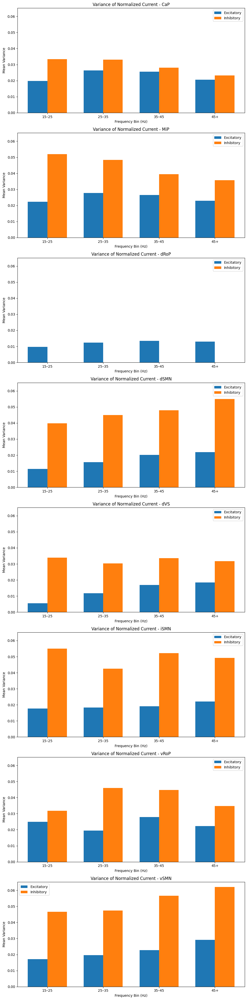

In [93]:
import matplotlib.pyplot as plt
import numpy as np

# Extract unique categories from variance_results keys
cell_types = sorted(set(k[0] for k in variance_results.keys()))
signal_types = ["Excitatory", "Inhibitory"]
freq_bins = sorted(set(k[2] for k in variance_results.keys()))
freq_bins.remove("<15")
fig, axes = plt.subplots(len(cell_types), 1, figsize=(10, 5 * len(cell_types)), sharey=True)

if len(cell_types) == 1:
    axes = [axes]  # Ensure axes is iterable

for ax, cell_type in zip(axes, cell_types):
    width = 0.35  # width of the bars
    x = np.arange(len(freq_bins))  # label locations

    # Gather data for each signal type per freq_bin
    excitatory_vars = [variance_results.get((cell_type, "Excitatory", fb), 0) for fb in freq_bins]
    inhibitory_vars = [variance_results.get((cell_type, "Inhibitory", fb), 0) for fb in freq_bins]

    # Plot bars side by side
    ax.bar(x - width/2, excitatory_vars, width, label='Excitatory', color='tab:blue')
    ax.bar(x + width/2, inhibitory_vars, width, label='Inhibitory', color='tab:orange')

    ax.set_xticks(x)
    ax.set_xticklabels(freq_bins)
    ax.set_title(f'Variance of Normalized Current - {cell_type}')
    ax.set_xlabel('Frequency Bin (Hz)')
    ax.set_ylabel('Mean Variance')
    ax.legend()

plt.tight_layout()
plt.show()


In [78]:
import pandas as pd
import numpy as np
from collections import defaultdict

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

def compute_variance_by_signal_type(binned_waveforms):
    # Organize: signal_type -> list of DataFrames
    grouped = defaultdict(list)

    for (freq, signal_type, cell_type, fast_slow), df in binned_waveforms.items():
        if df.shape != (50, 4):
            continue
        grouped[group_EI(signal_type)].append(df.copy())

    result = {}  # signal_type -> mean variance across phase

    for signal_type in ["Excitatory", "Inhibitory"]:
        dfs = grouped.get(signal_type, [])
        if not dfs:
            continue
        combined = pd.concat(dfs, ignore_index=True)
        combined['Phase'] = np.tile(np.arange(0.01, 1.00001, 0.02), len(dfs))
        var_by_phase = combined.groupby('Phase')['Normalized Current'].var()
        mean_var = var_by_phase.mean()
        result[signal_type] = mean_var

    return result
variance_results = compute_variance_by_signal_type(binned_waveforms_new)

for signal, var in variance_results.items():
    print(f"{signal}: Mean Variance = {var:.4f}")

Excitatory: Mean Variance = 0.0280
Inhibitory: Mean Variance = 0.0486


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/730917152.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(keys))


No matching waveforms found for ('<15', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('35–45', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('25–35', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('45+', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dVS', 'Low Rin Secondary ')
No matching waveforms found for ('35–45', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/730917152.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.8, 1])


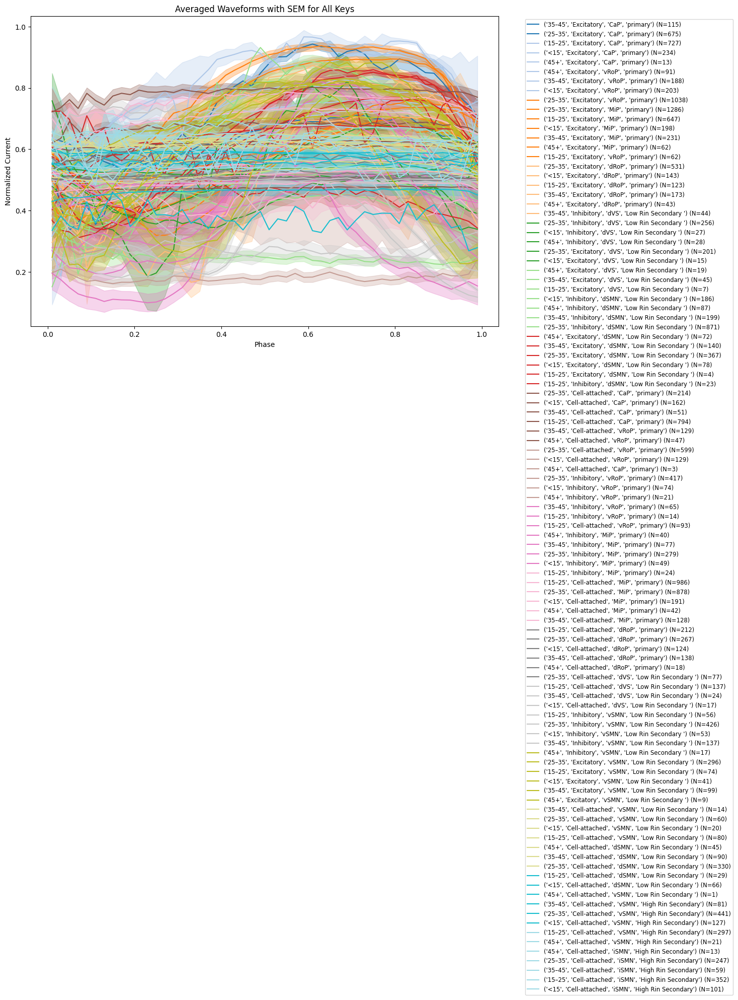

In [39]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Set up color map based on number of unique keys
keys = list(key_counts_all.keys())
cmap = cm.get_cmap('tab20', len(keys))

# Create a single figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot each waveform on the same axis
for idx, key in enumerate(keys):
    count = key_counts_all[key]
    avg_waveform_df = average_waveforms_for_key(key)

    if avg_waveform_df is not None:
        color = cmap(idx)
        label = f"{key} (N={count})"

        ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label=label, color=color)
        ax.fill_between(avg_waveform_df['Phase'],
                        avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                        avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                        color=color, alpha=0.3)

# Label and title
ax.set_xlabel('Phase')
ax.set_ylabel('Normalized Current')
ax.set_title('Averaged Waveforms with SEM for All Keys')
ax.legend(fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout(rect=[0, 0, 0.8, 1])
plt.show()


No matching waveforms found for ('<15', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('35–45', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('25–35', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('45+', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'CaP', 'primary')


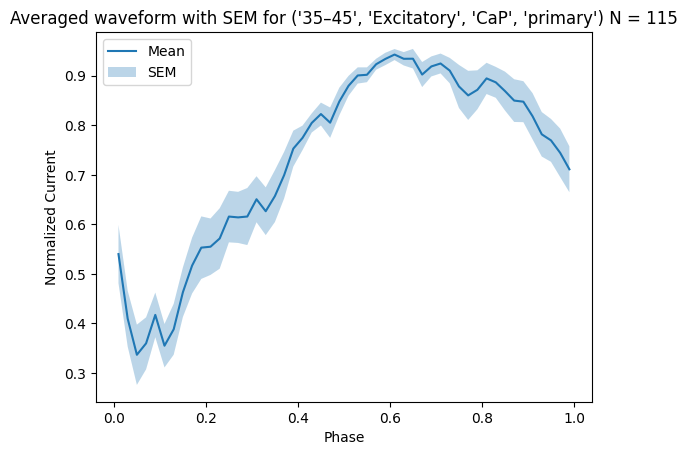

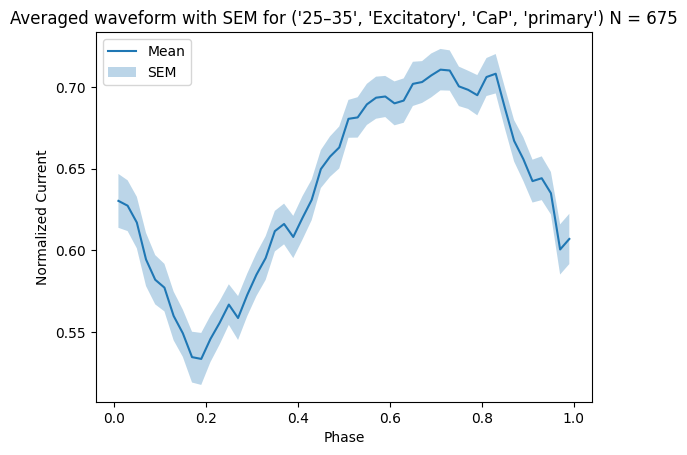

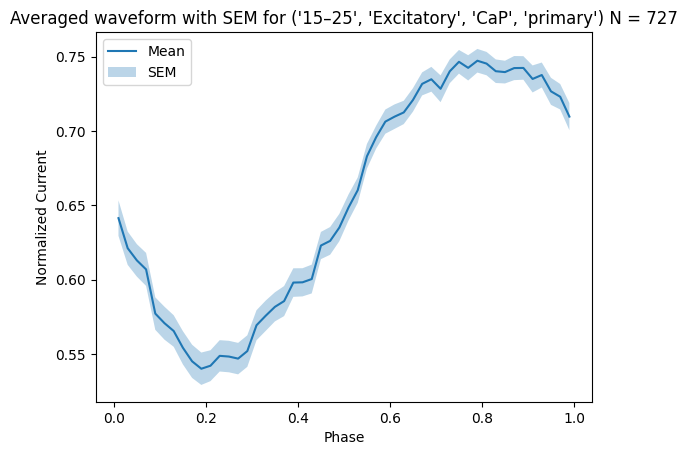

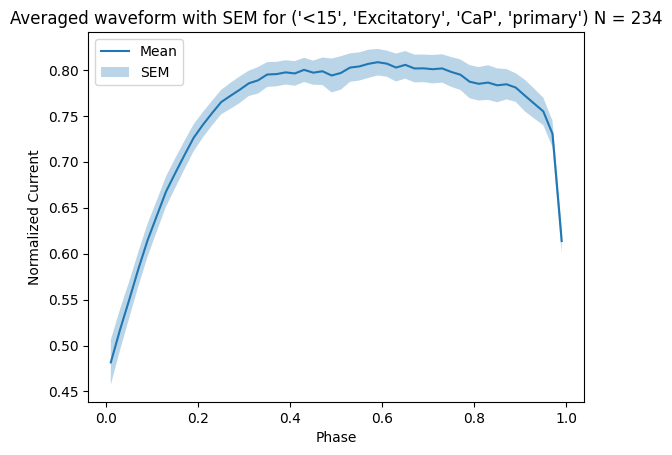

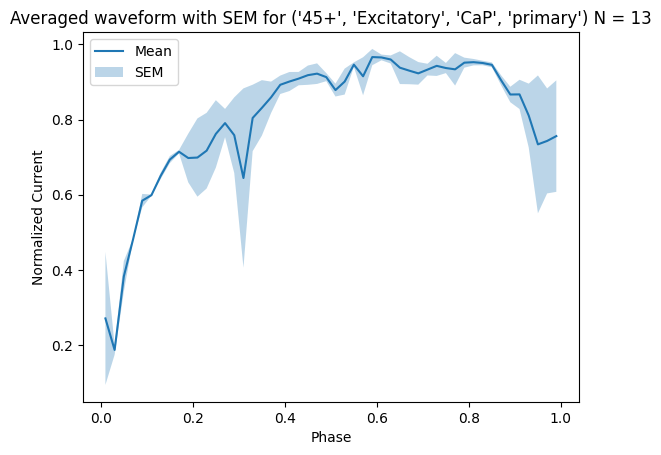

...

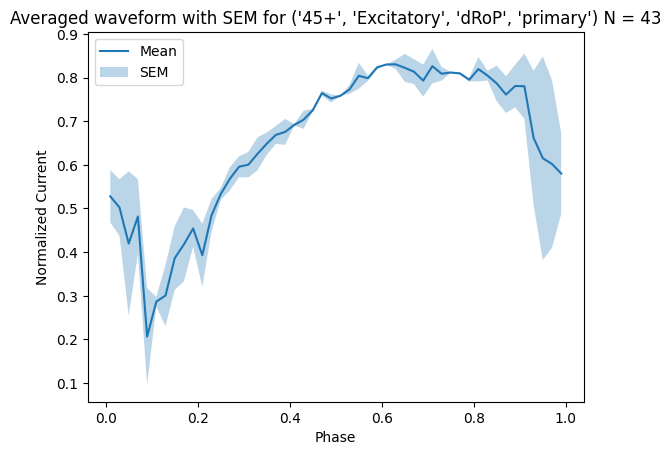

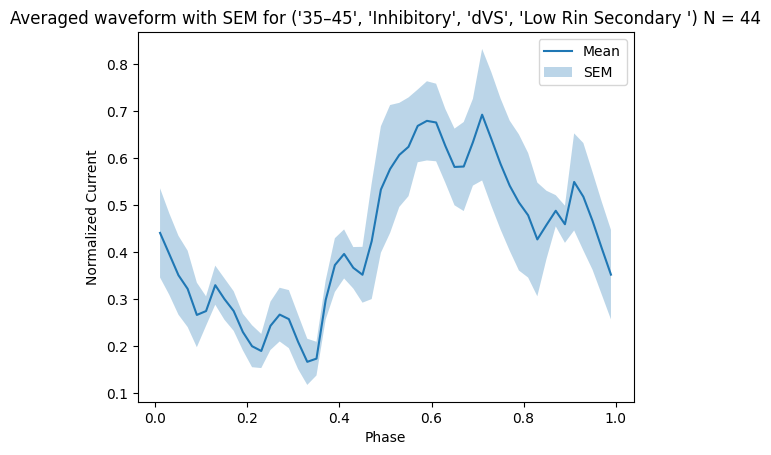

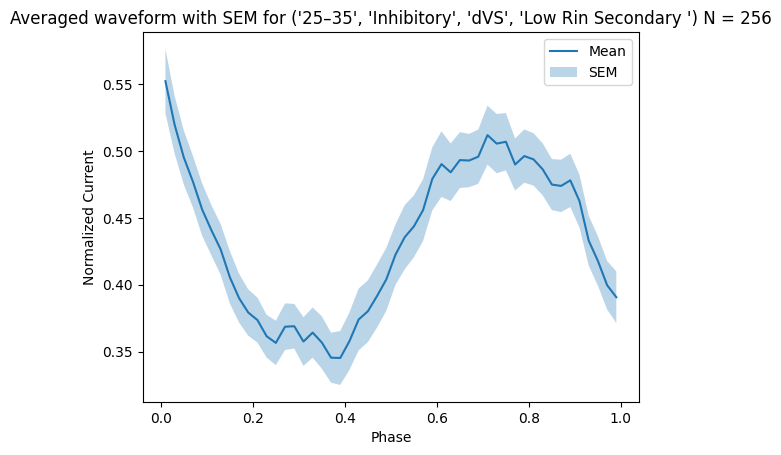

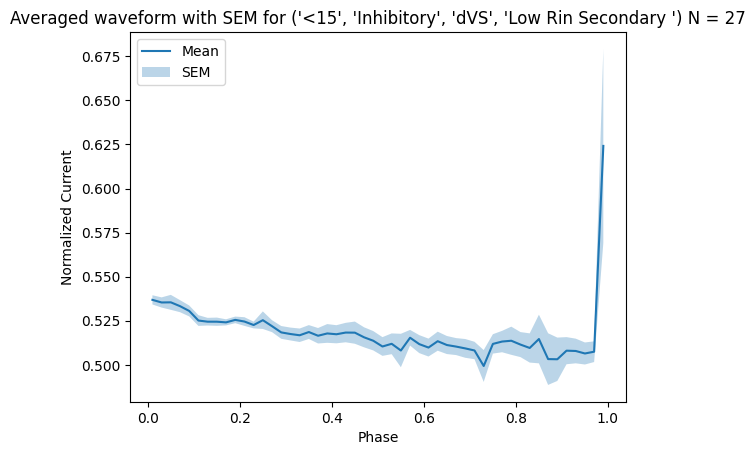

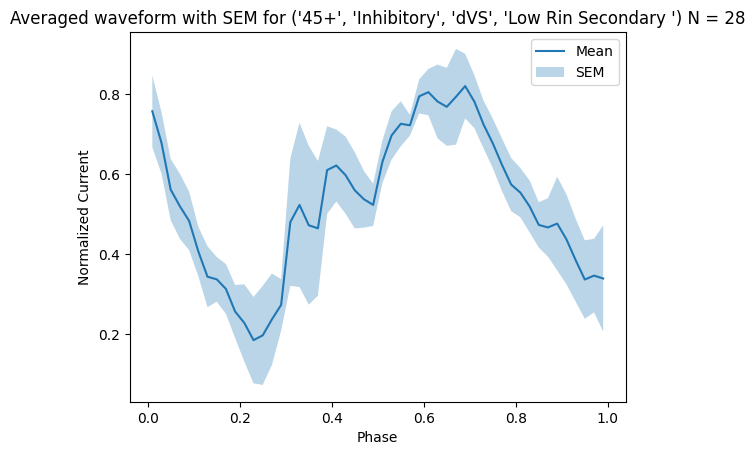

No matching waveforms found for ('15–25', 'Inhibitory', 'dVS', 'Low Rin Secondary ')


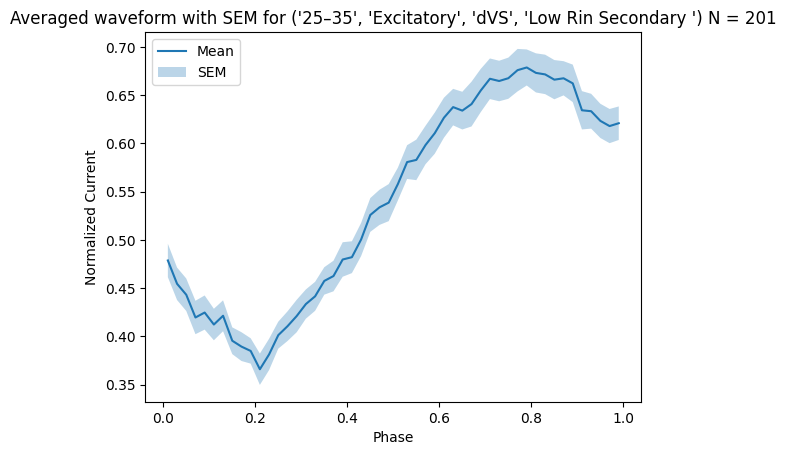

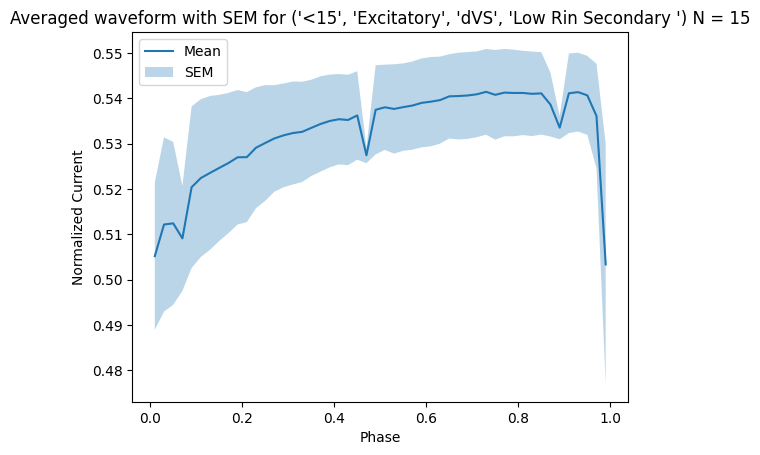

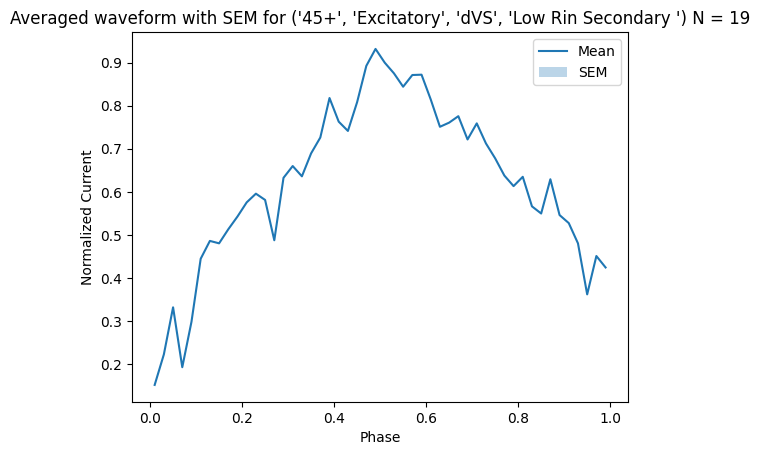

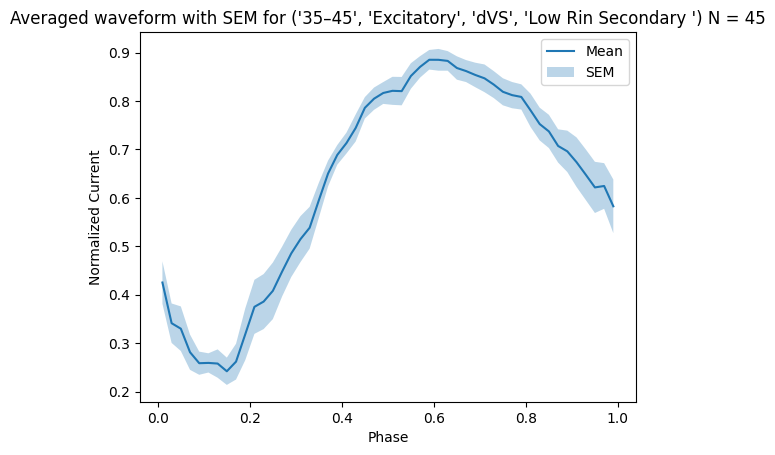

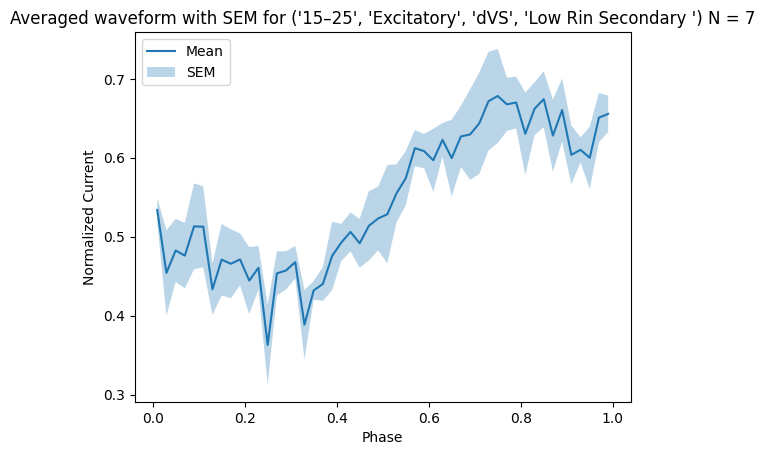

...

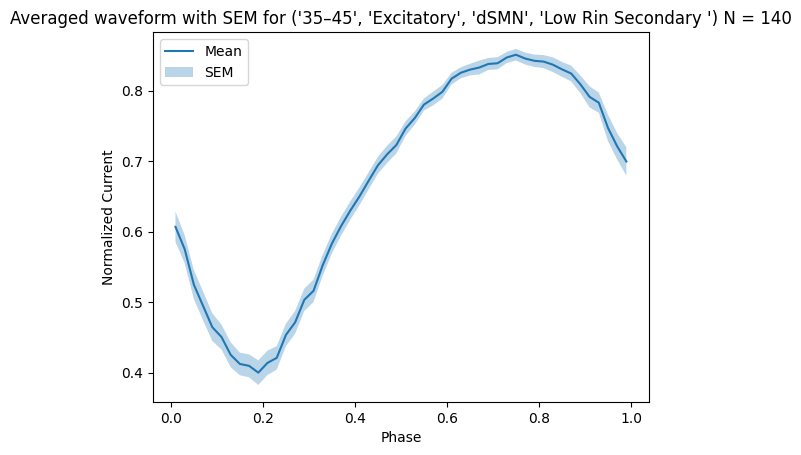

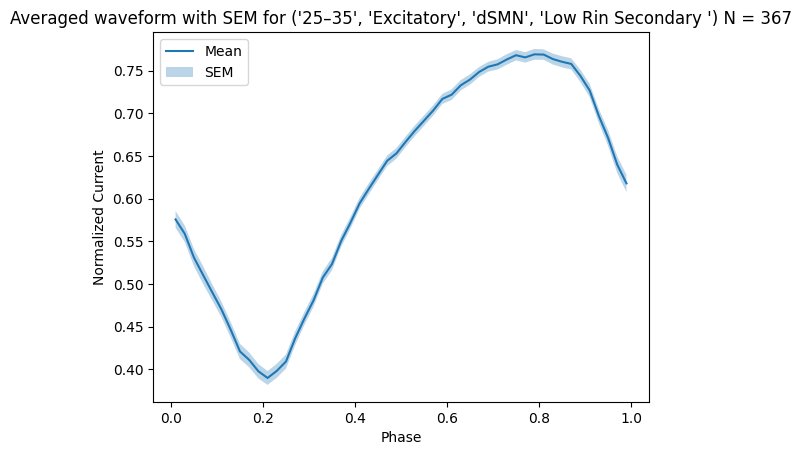

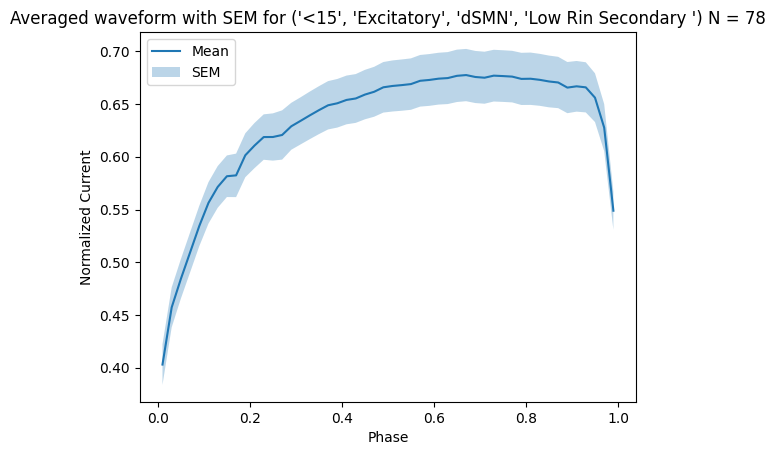

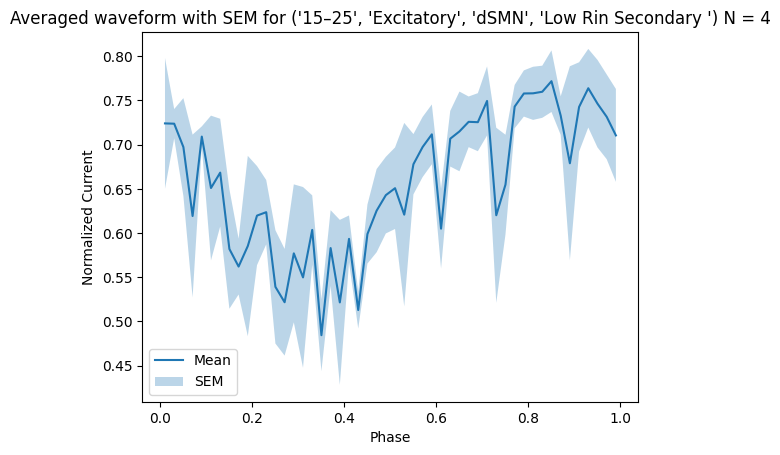

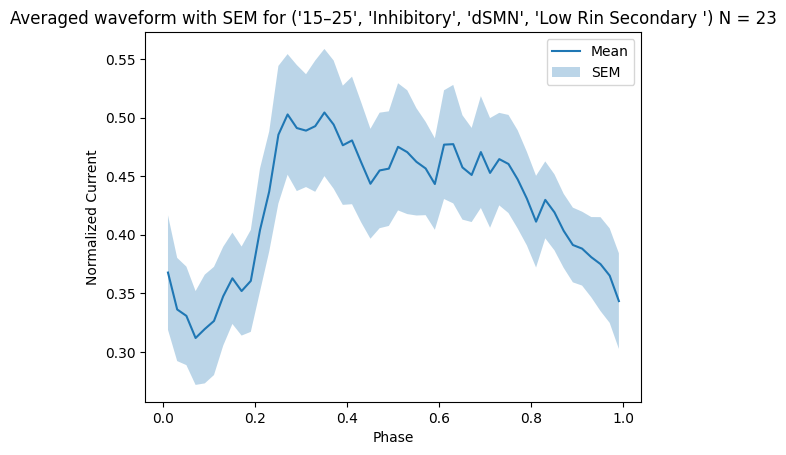

No matching waveforms found for ('35–45', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN'

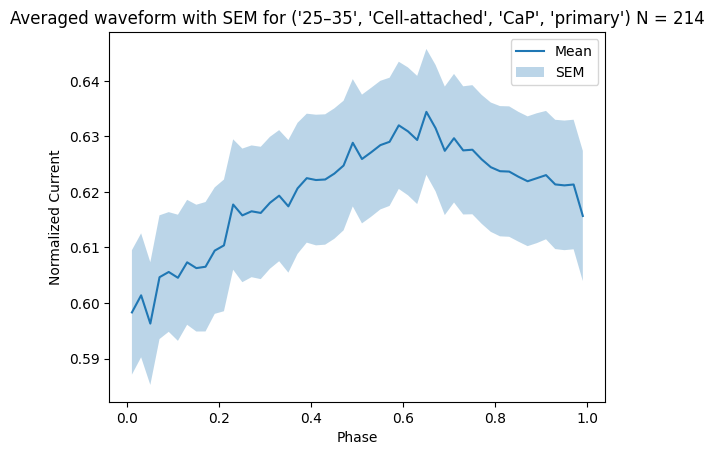

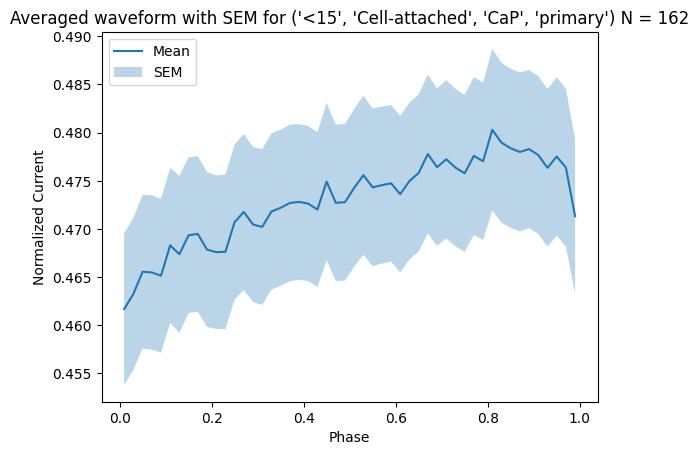

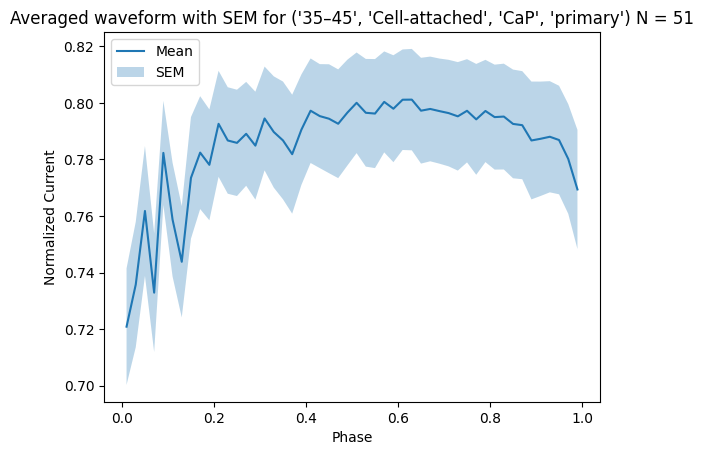

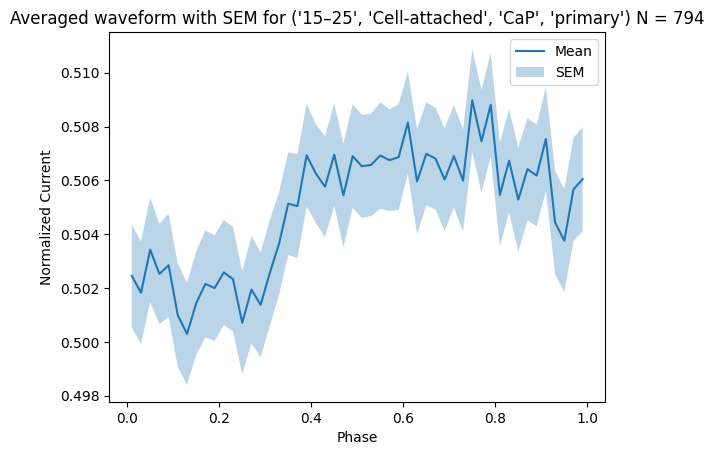

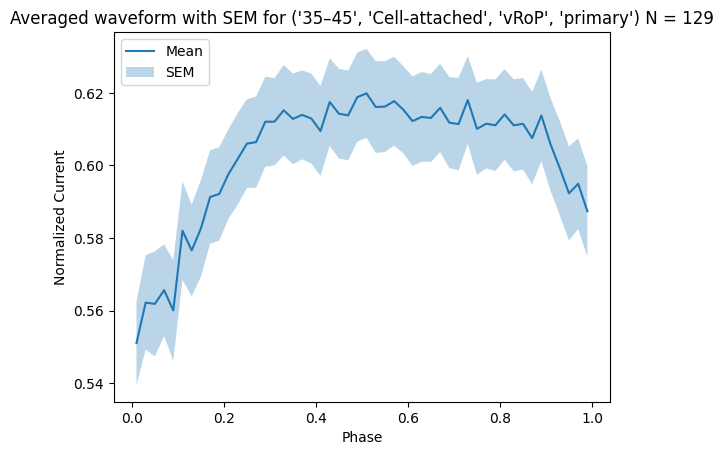

...

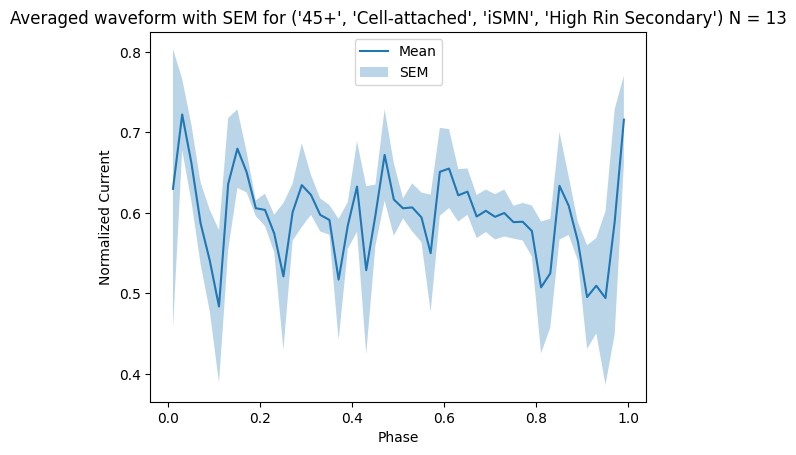

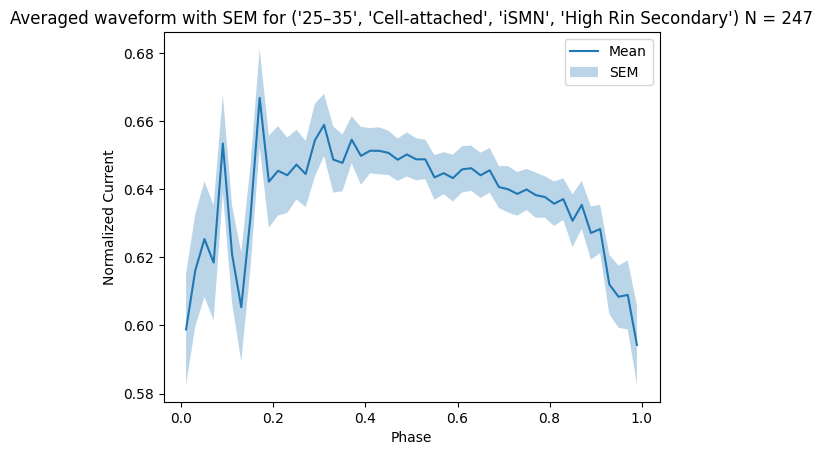

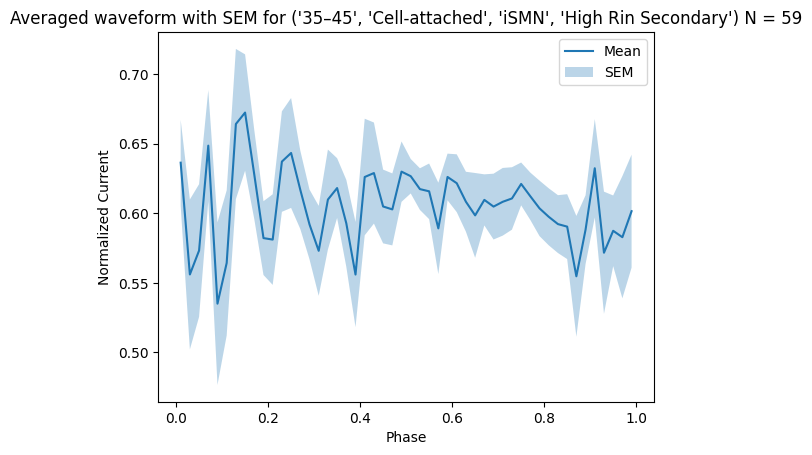

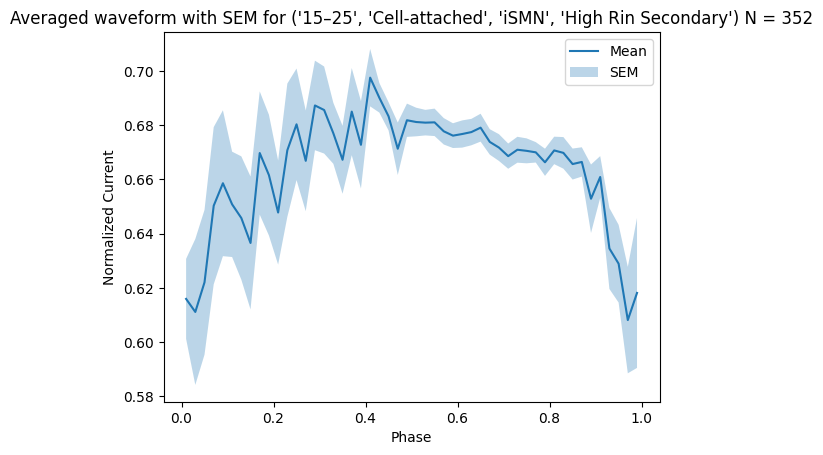

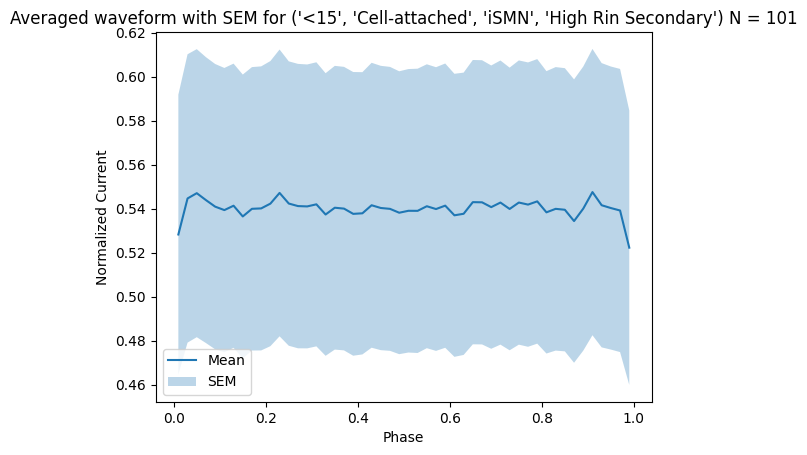

In [40]:
for key in key_counts_all.keys():
    count = key_counts_all[key]  # Get count for current key
    avg_waveform_df = average_waveforms_for_key(key)
    plot_avg_wf(avg_waveform_df,key)

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_74614/1796533653.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))
/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_74614/1796533653.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize='small')


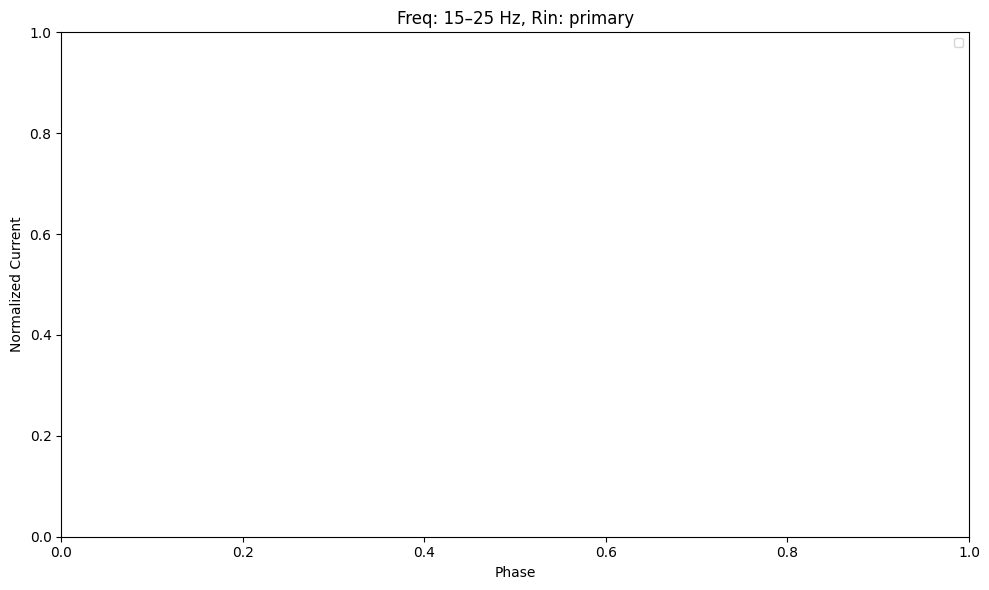

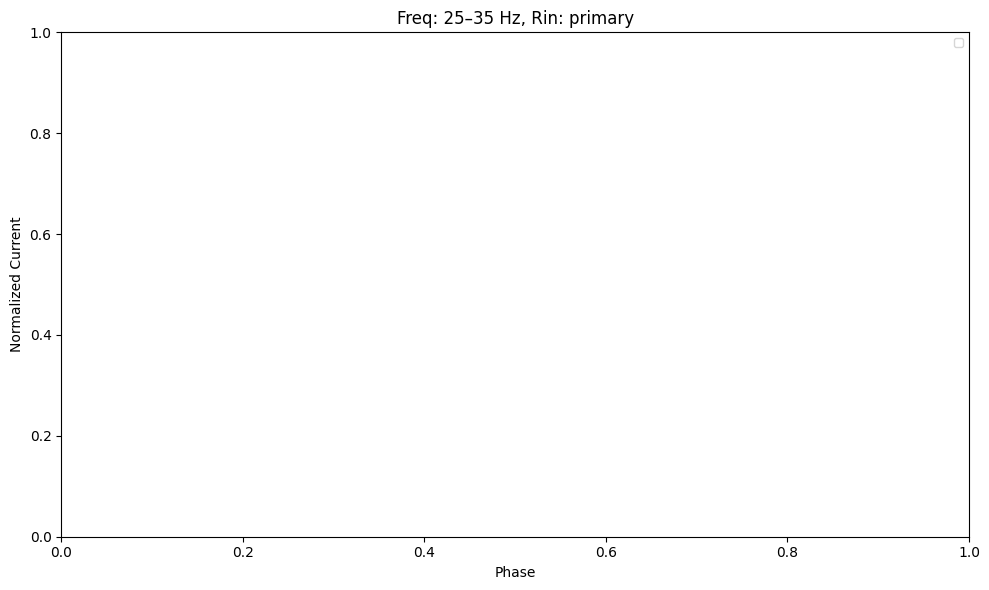

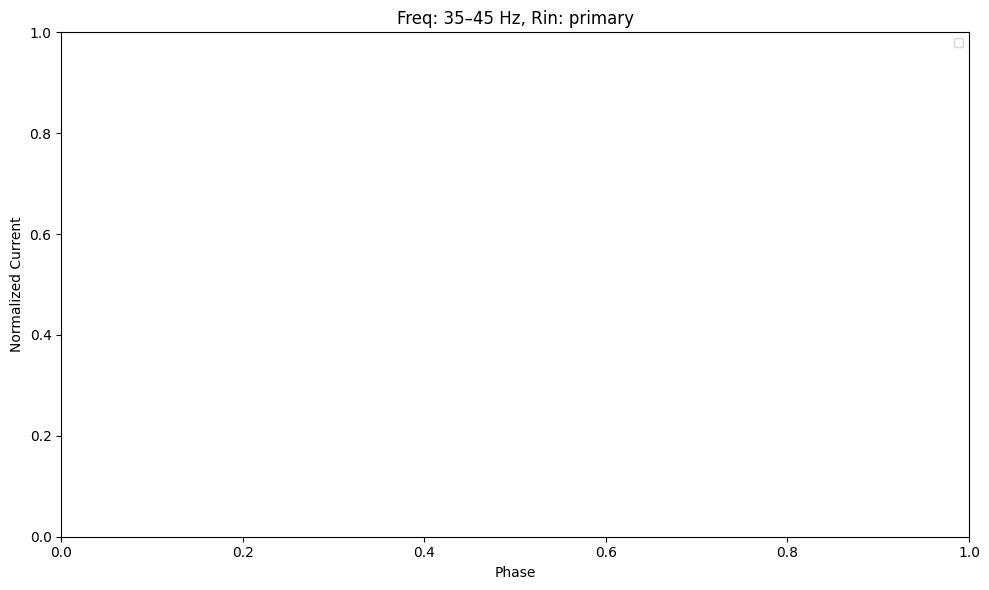

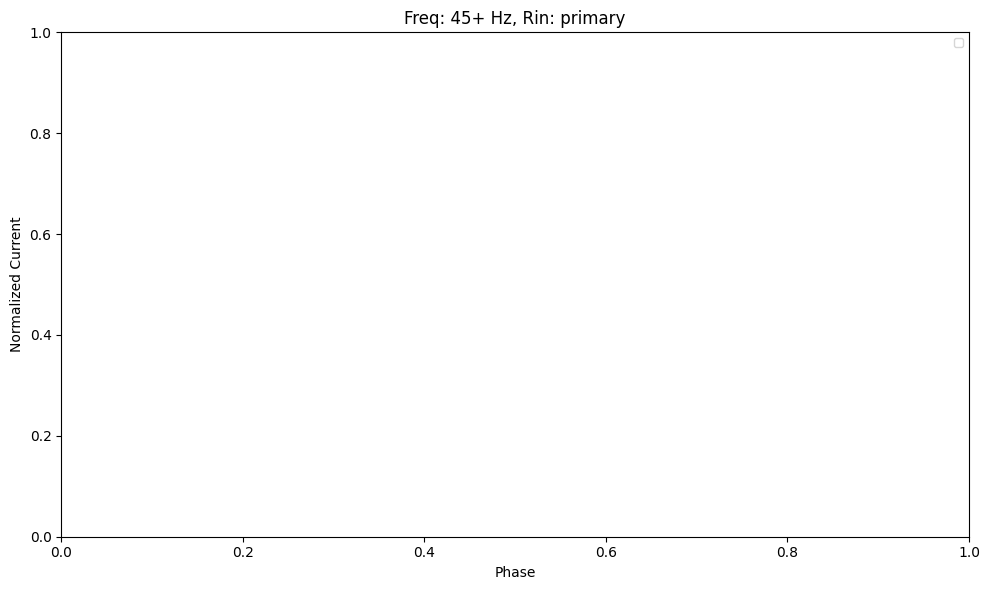

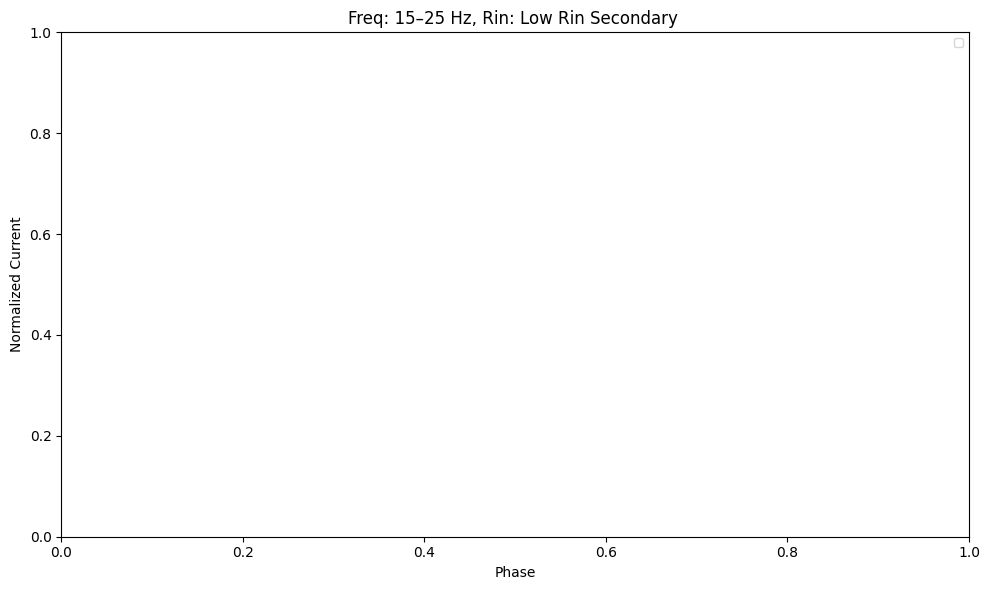

...

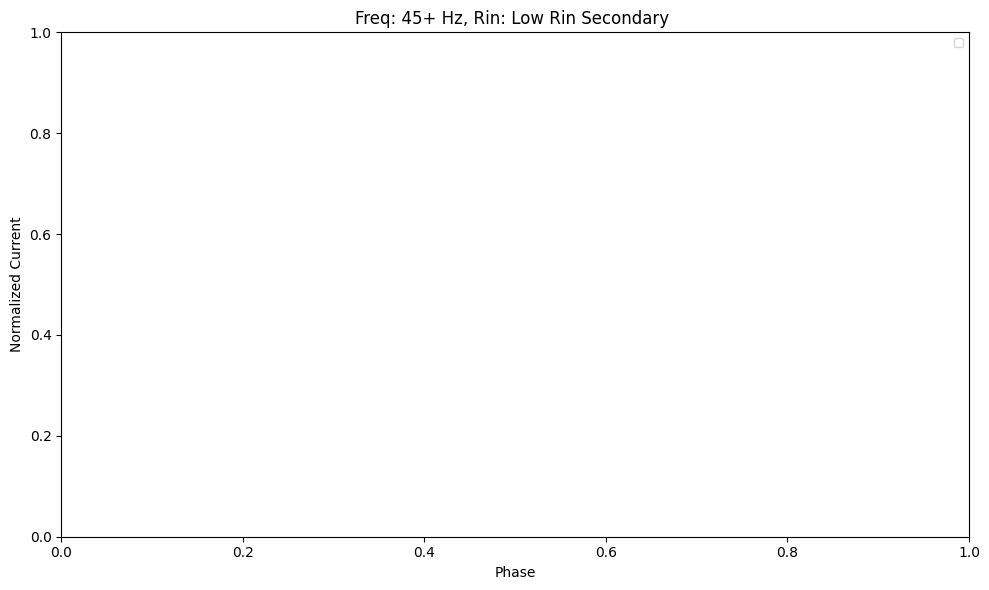

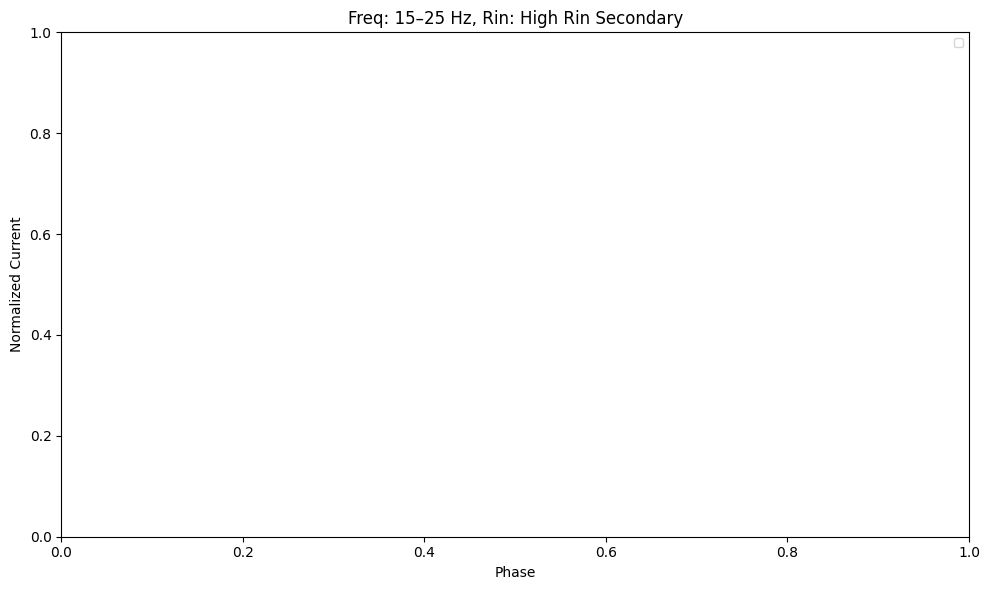

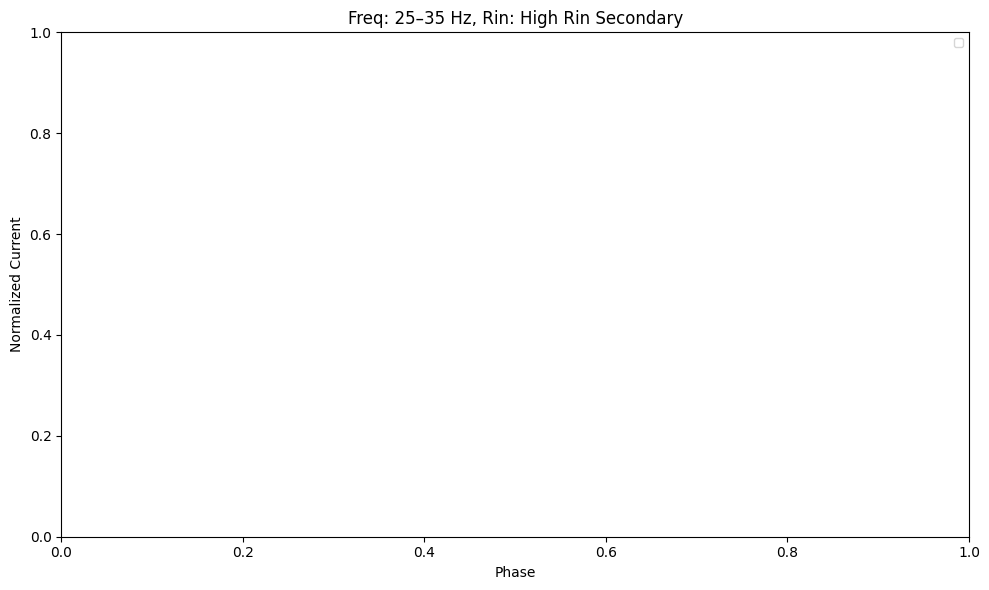

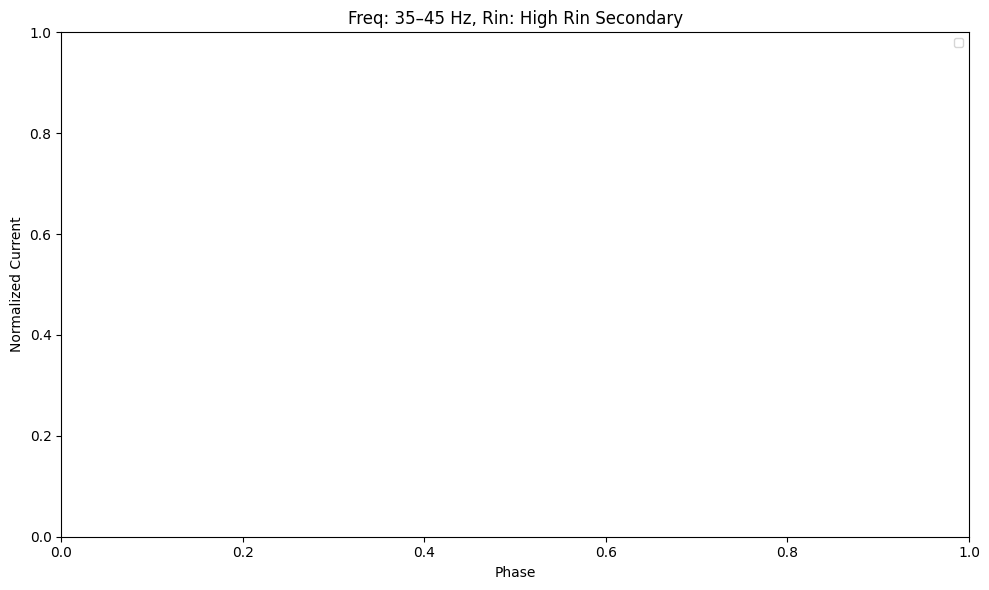

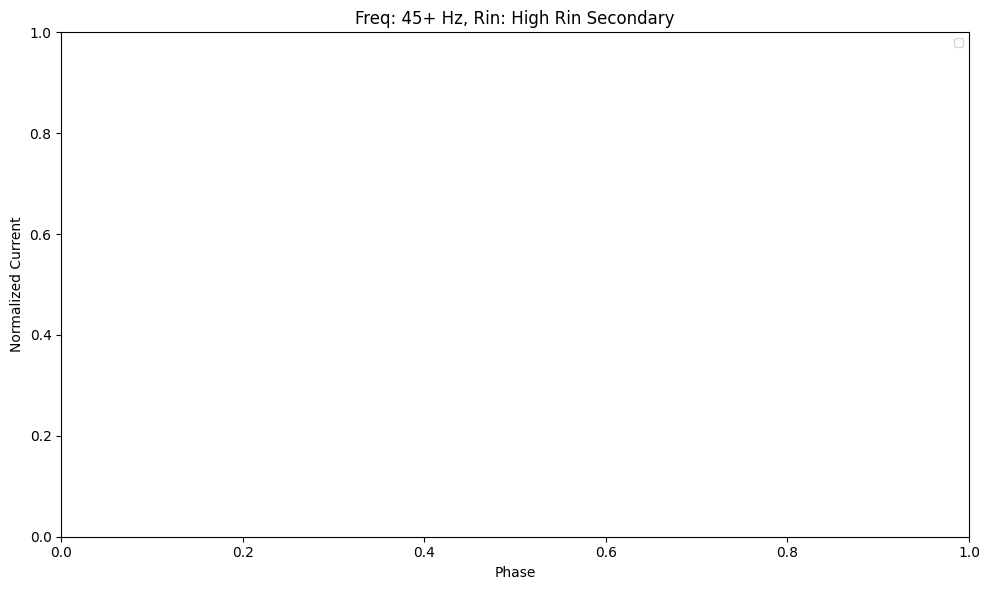

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

freq_bins = ["15–25", "25–35", "35–45", "45+"]
rin_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

for speed in rin_categories:
    for freq_bin in freq_bins:
        fig, ax = plt.subplots(figsize=(10, 6))
        
        # Filter keys for this freq_bin and speed, ignoring freq_bin == '<15'
        matching_keys = [key for key in binned_waveforms.keys()
                         if get_freq_bin(key[0]) == freq_bin and
                            key[3] == speed and
                            get_freq_bin(key[0]) != '<15']

        # Track labels used to avoid duplicates
        used_labels = set()
        
        for signal_type in signal_types:
            # Filter keys further by signal_type
            keys_for_signal = [k for k in matching_keys if k[1] == signal_type]
            if not keys_for_signal:
                continue
            
            # Collect dataframes for this signal_type
            dfs = [binned_waveforms[key].copy() for key in keys_for_signal]
            combined = pd.concat(dfs)
            grouped = combined.groupby('Phase Bin', observed=False)
            averaged = grouped.mean().reset_index()
            sem = grouped.sem().reset_index()

            label = signal_type if signal_type not in used_labels else None
            ax.plot(averaged['Phase'], averaged['Normalized Current'],
                    label=label, color=signal_type_colors[signal_type])
            ax.fill_between(averaged['Phase'],
                            averaged['Normalized Current'] - sem['Normalized Current'],
                            averaged['Normalized Current'] + sem['Normalized Current'],
                            color=signal_type_colors[signal_type], alpha=0.3)
            used_labels.add(signal_type)

        ax.set_title(f"Freq: {freq_bin} Hz, Rin: {speed}")
        ax.set_xlabel('Phase')
        ax.set_ylabel('Normalized Current')
        ax.legend(fontsize='small')
        plt.tight_layout()
        plt.show()
